In [6]:
#General Idea:

#The main problem we are trying to solve is to see under what conditions the continuum gradient can give us 
#a measurement of the local pressure gradient to better understand the formation of disk sub-structure. To compute
#the pressure gradient, we need the gas surface density and temperature gradients. The continuum 
#gradient is reliant on the gradients of the temperature, gas surface density, dust-gas ratio, and opacity. If the
#dust-gas ratio and opacity gradients are negligible, then there will be a direct correspondance between the
#continuum and pressure gradients. To find the limitations of the correspondance, we want to analyze
#how the dust-gas ratio and opacity gradients behave as the model changes. Two ways to change the model to identify
#and describe trends in dust-gas ratio and opacity gradients are through changes in the dust population and changes
#in the location and amplitude of the surface density perturbation. We also want to see how much noise can be
#present before the correspondance breaks.

#Defining necessary constants
# Import NumPy for array handling
#
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
from radmc3dPy import *
from radmc3dPy import analyze
import subprocess as p
import math as m
%pylab inline
import os

#
# A simple grid refinement function
#
def grid_refine_inner_edge(x_orig,nlev,nspan):
    x     = x_orig.copy()
    rev   = x[0]>x[1]
    for ilev in range(nlev):
        x_new = 0.5 * (x[1:nspan+1] + x[:nspan])
        x_ref = np.hstack((x,x_new))
        x_ref.sort()
        x     = x_ref
        if rev:
            x = x[::-1]
    return x
#
# Some natural constants
#
au  = 1.49598e13     # Astronomical Unit       [cm]
pc  = 3.08572e18     # Parsec                  [cm]
ms  = 1.98892e33     # Solar mass              [g]
ts  = 5.78e3         # Solar temperature       [K]
ls  = 3.8525e33      # Solar luminosity        [erg/s]
rs  = 6.96e10        # Solar radius            [cm]
ss  = 5.6703e-5      # Stefan-Boltzmann const  [erg/cm^2/K^4/s]
kk  = 1.3807e-16     # Bolzmann's constant     [erg/K]
mp  = 1.6726e-24     # Mass of proton          [g]
GG  = 6.67408e-08    # Gravitational constant  [cm^3/g/s^2]
pi  = np.pi          # Pi

#
# Star parameters
#
mstar    = ms
rstar    = rs
tstar    = ts
pstar    = np.array([0.,0.,0.])

#Mass ratios of dust populations
#optool -c h2o .20 -c astrosil .3291 -c tro .0743 -c org .3966
h2o = .2
astrosil = .3291
tro = .0743
org = .3966

#
# First make a simple analytical disk model roughly along the
# lines of Chiang & Goldreich (1997), but with just a single
# vertical layer and with a constant radiative incidence angle.
#
flang    = 0.05      # The assumed constant radiative incidence angle
nr       = 500        # Nr of radial grid points
rin      = 1*au     # Inner radius
rout     = 260*au    # Outer radius
nlev_rin = 12        # Grid refinement at the inner edge: nr of cycles
nspan_rin= 3         # Grid refinement at the inner edge: nr of cells each cycle
ri       = np.logspace(np.log10(rin),np.log10(rout),nr+1)
#ri       = grid_refine_inner_edge(ri,nlev_rin,nspan_rin)   # Refinement at inner edge
rc       = 0.5 * ( ri[:-1] + ri[1:] )
nr       = len(rc)   # Recompute nr, because of refinement at inner edge
r        = rc        # The radial grid of the analytic disk model
lstar    = 4*pi*rstar**2*ss*tstar**4   # Stellar luminosity
firr     = flang*lstar/(4*pi*r**2)     # Irradiative flux
tmid     = (firr/ss)**0.25             # Estimate of midplane temperature
cs       = np.sqrt(kk*tmid/(2.3*mp))   # Isothermal sound speed at midplane
omk      = np.sqrt(GG*mstar/r**3)      # The Kepler angular frequency     
hp       = cs/omk                      # The pressure scale height
hpr      = hp/r                        # The dimensionless hp

#FARGO constants
Mstar = 1. #scale free code units
R0 = 1. #scale free code units
Msun = 1.9891e33 # cgs
AU = 1.49598e13 #cgs
yr = 3.14e7 #seconds
cmtokm = 10**(-5) #converts cm to km
R_mu = 36149835 # (R/mu) for 2.4 g/mol in PPD
Gconv = 6.6743e-8 # cgs
S0conv = (Msun/(AU**2)) #S0cgs = S0code*S0conv
Tconv = 1./(2.*pi) # 2PI = 1 orbit at R0 = 1 yr T(years) = Tcode*Tconv
Tconv_cgs = (1./(2.*pi))*yr #T(cgs) = Tcode*Tconv_cgs
Vconv_cgs = sqrt(Gconv*Mstar*Msun/(R0*AU)) #V(cgs) = Vcode*Vconv_cgs
Vconv_kms = Vconv_cgs/10**5
Econv_cgs = Msun*Mstar*(R0*AU)**2/(Tconv_cgs)**2

#
# Vertical grid parameters (theta-grid in spherical coordinates)
#
ntheta   = 100
zrmax    = 0.5
thetaup  = np.pi*0.5 - 0.5e0

#
# Make the theta and phi coordinates
#
nphi     = 10
thetai   = np.linspace(thetaup,0.5e0*np.pi,ntheta+1)
phii     = np.linspace(0.e0,np.pi*2.e0,nphi+1)
thetac   = 0.5 * ( thetai[0:ntheta] + thetai[1:ntheta+1] )
phic     = 0.5 * ( phii[0:nphi] + phii[1:nphi+1] )

#
# Make the 2-D grid (actually 3-D but with axisymmetry)
#
qq       = np.meshgrid(rc,thetac,phic,indexing='ij')
rr       = qq[0]
tt       = qq[1]
zr       = np.pi/2.e0 - qq[1]

# Monte Carlo parameters
#
nphot    = 100000000

#
# Write the wavelength_micron.inp file
#
lam1     = 0.1e0
lam2     = 7.0e0
lam3     = 25.e0
lam4     = 1.0e4
n12      = 20
n23      = 100
n34      = 30
lam12    = np.logspace(np.log10(lam1),np.log10(lam2),n12,endpoint=False)
lam23    = np.logspace(np.log10(lam2),np.log10(lam3),n23,endpoint=False)
lam34    = np.logspace(np.log10(lam3),np.log10(lam4),n34,endpoint=True)
lam      = np.concatenate([lam12,lam23,lam34])
nlam     = lam.size

dustpop_num = 16
    


%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


/home/evan/anaconda3/lib/python3.9/site-packages/IPython/core/magics/pylab.py:162: UserWarning: pylab import has clobbered these variables: ['f']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [7]:
infall_zones = [(15,30),(15,45),(15,60),(20,30),(30,45),(30,105),(30,45),(30,60),(45,60),(45,75),(5,30),(5,45),(5,75),
               (60,105),(60,75),(75,105)]

def make_filename(iz_tup):
    rin = np.round(float(iz_tup[0]),1)
    rc = np.round(float(iz_tup[1]),1)
    return '{}_{}.txt'.format(rin,rc)

def getRin_Rc(iz_tup):
    rin = np.round(float(iz_tup[0]),1)
    rc = np.round(float(iz_tup[1]),1)
    return rin, rc

cwd = os.getcwd()
path=cwd + '/' #if you are running the code in a different directory from the files for example
filenames = [[] for i in range(0, len(infall_zones))]
Rin_list = [[] for i in range(0, len(infall_zones))]
Rc_list = [[] for i in range(0, len(infall_zones))]
for i in range(0, len(infall_zones)):
    filenames[i] = path + make_filename(infall_zones[i])
    Rin_list[i], Rc_list[i] = getRin_Rc(infall_zones[i])
#otherwise you can use the list above to select which simulation you'd like to do
#filename = make_filename(infall_zones[7])
print(filenames)
print(Rin_list)
print(Rc_list)
#Ad = (Sd-Sd0)/Sd0
#Sd0 = 0.01*Sg_0

['/home/evan/Protostellar_Disks/FARGO_Model/15.0_30.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/15.0_45.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/15.0_60.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/20.0_30.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/30.0_45.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/30.0_105.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/30.0_45.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/30.0_60.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/45.0_60.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/45.0_75.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/5.0_30.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/5.0_45.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/5.0_75.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/60.0_105.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/60.0_75.0.txt', '/home/evan/Protostellar_Disks/FARGO_Model/75.0_105.0.txt']
[15.0, 15.0, 15.0, 20.0, 30.0, 30.0, 30.0, 30.0, 45.0, 

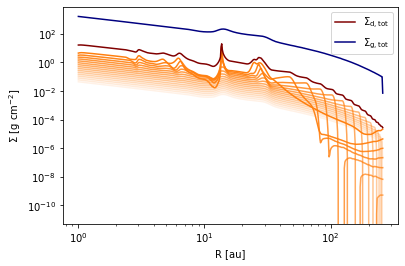

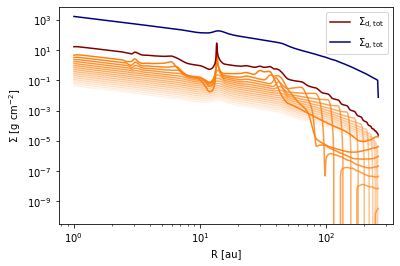

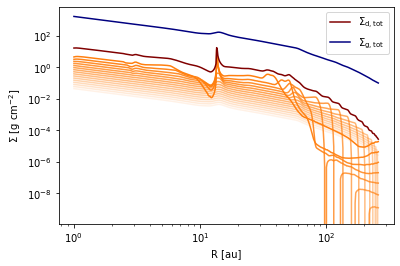

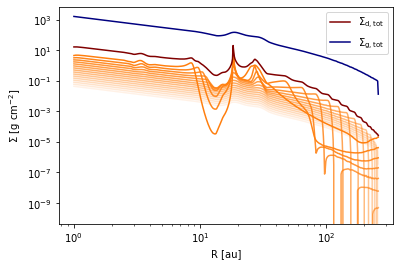

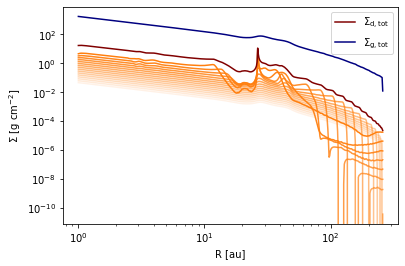

...

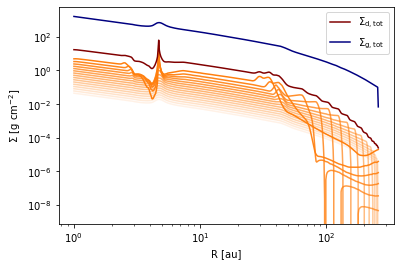

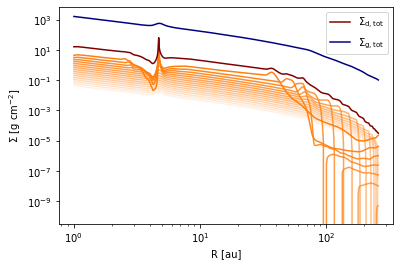

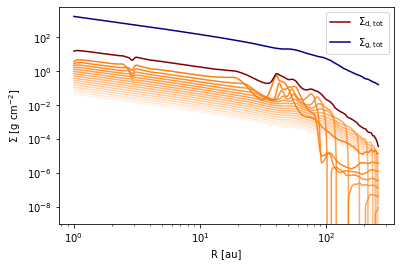

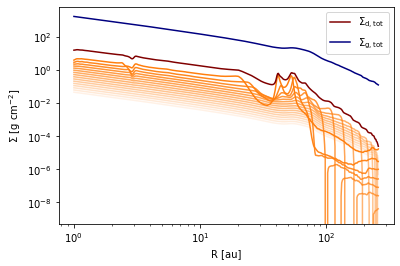

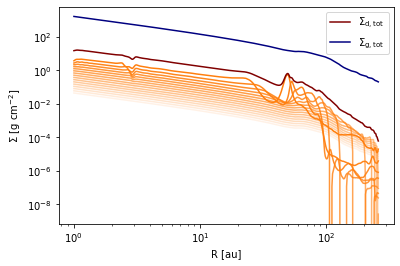

In [8]:
class sim_perturb:
    def __init__(self,filename, r_array, eps_0=0.01,pl=-3.5):
    #load in relative dust perturbation amplitudes from a single simulation run
        A_dust = np.loadtxt(filename) # A_dust = (Sd-Sd0)/Sd0 num_r x num_a in size
        a_bins = np.logspace(-4, 0, 16) #dust size bin centers from simulation 
        r_sim = np.logspace(np.log10(1),np.log10(260),2048) #simulation radial grid, different from r_array: the grid radmc will use
        Sg_0 =  1700*(r_sim)**(-1)*np.exp(-r_sim/60.) #original simulation gas surface density
        Sd_0 = eps_0*Sg_0 # initial simulation dust surface density (unperturbed - across all bins)
        dlna = np.gradient(np.log(a_bins)) #bin width
    
        w_  = a_bins*(a_bins**3)*(a_bins**(pl))*dlna #unnormalized density weighting factor for each bin with MRN distribution
        c_0 = 1./np.sum(w_) #normalization factor such that all weights sum to 1 at the start
        w_0 = np.expand_dims(c_0*w_,axis=-1) #normalized initial density weighting factor
        w_i = w_0*((A_dust+1).T) #final density weighting factor applying perturbation amplitude at each bin
    
    
        Sd_0_all = w_0*Sd_0 #initial surface density of dust populations by bin
        Sd_p_all = w_i*Sd_0 #perturbed " "
        Sg_tot = (w_i/w_0)[0] * Sg_0 #perturbed gas surface density
    
        #now here it is interpolated onto the input radial grid to be used in radmc
        self.Sd_0_all_i = [np.interp(r_array, r_sim, row) for row in Sd_0_all] # initial dust content: each row corresponds to a dust population in a particular size bin
        self.Sd_p_all_i = [np.interp(r_array, r_sim, row) for row in Sd_p_all] # perturbed dust content: " "
        self.Sg_p_tot_i = np.interp(r_array,r_sim,Sg_tot) #perturbed gas surface density total
        self.A_p_all_i = [ row1/row2 - 1. for row1,row2 in zip(self.Sd_p_all_i,self.Sd_0_all_i)]#relative amplitudes of perturbation for each size bin
        self.eps_p_all_i = self.Sd_p_all_i/self.Sg_p_tot_i # dust to gas ratio by bin

        #summed across all grain sizes:
        self.Sd_0_tot = np.sum(self.Sd_0_all_i, axis=0) # total initial dust surface density
        self.Sd_p_tot = np.sum(self.Sd_p_all_i, axis=0) # total perturbed dust surface density
        self.A_tot = self.Sd_p_tot/self.Sd_0_tot  - 1. #total relative amplitude of the perturbation of the surface density
        self.eps_tot = self.Sd_p_tot/self.Sg_p_tot_i #total dust to gas to ratio
        
        self.r_arr = r_array
        
        self.w_0 = w_0 
        
    
    def plot_SD(self):
        #example plot
        for row, alpha in zip(self.Sd_p_all_i,np.linspace(0.1,1,16)):
            loglog(self.r_arr,row,color='C1',alpha=alpha)
        loglog(self.r_arr,self.Sd_p_tot,color='maroon',label=r'$\Sigma_{\rm d,tot}$')
        loglog(self.r_arr,self.Sg_p_tot_i,color='navy',label=r'$\Sigma_{\rm g,tot}$')
        xlabel('R [au]')
        ylabel(r'$\Sigma \ \mathrm{[g \ cm^{-2}]}$')
        legend()


#Create and save instances of the sim_perturb class for each perturbation to a list
SD_Pert = [[] for i in range(0, len(infall_zones))]
for i in range(0, len(infall_zones)):
    SD_Pert[i] = sim_perturb(filenames[i], r / au)

#Plot dust surface density for all grain sizes for each perturbation
for i in range(0, len(infall_zones)):
    SD_Pert[i].plot_SD()
    plt.show()


In [9]:
#Defining a Function for Input Files
#Each time the perturbation search loop runs, we want to save data for each dust grain size so that we can
#calculate mass fractions of each dust grain size at each radius and use them to calculate opacity as a function 
#of r and theta. We also want to save data for the total dust surface density. 

def rad_setup_FARGO(radius, SD_Pert_index, NoPert, dustpop_num):
    
    if NoPert == True:
        sigmad_total = SD_Pert[SD_Pert_index].Sd_0_tot
        sigmad_individual = [[] for i in range(0, dustpop_num)]
        for i in range(0, dustpop_num):
            sigmad_individual[i] = SD_Pert[SD_Pert_index].Sd_0_all_i[i]
        
    else:
        sigmad_total = SD_Pert[SD_Pert_index].Sd_p_tot
        sigmad_individual = [[] for i in range(0, dustpop_num)]
        for i in range(0, dustpop_num):
            sigmad_individual[i] = SD_Pert[SD_Pert_index].Sd_p_all_i[i]
    
            
    #
    # Expand the 1-D analytic model to 2-D
    #
    sigmad_3d_total  = np.meshgrid(sigmad_total,thetac,phic,indexing='ij')[0]
    sigmad_3d_individual = [[] for i in range(0, dustpop_num)]
    for i in range(0, dustpop_num):
        sigmad_3d_individual[i] = np.meshgrid(sigmad_individual[i],thetac,phic,indexing='ij')[0]
    
    hh         = np.meshgrid(.25*hp,thetac,phic,indexing='ij')[0]
    hhr        = np.meshgrid(.25*hpr,thetac,phic,indexing='ij')[0]

    #
    # Make the dust density model
    #
    rhod_total = sigmad_3d_total / (np.sqrt(2.e0*np.pi)*hh) * np.exp(-((zr**2/hhr**2)/2.e0))
    rhod_individual = [[] for i in range(0, dustpop_num)]
    for i in range(0, dustpop_num):
        rhod_individual[i] = sigmad_3d_individual[i] / (np.sqrt(2.e0*np.pi)*hh) * np.exp(-((zr**2/hhr**2)/2.e0))
    
    #
    # Write the wavelength file
    #
    with open('wavelength_micron.inp','w+') as f:
        f.write('%d\n'%(nlam))
        for value in lam:
            f.write('%13.6e\n'%(value))
    #
    #
    # Write the stars.inp file
    #
    with open('stars.inp','w+') as f:
        f.write('2\n')
        f.write('1 %d\n\n'%(nlam))
        f.write('%13.6e %13.6e %13.6e %13.6e %13.6e\n\n'%(rstar,mstar,pstar[0],pstar[1],pstar[2]))
        for value in lam:
            f.write('%13.6e\n'%(value))
        f.write('\n%13.6e\n'%(-tstar))
    #
    # Write the grid file
    #
    with open('amr_grid.inp','w+') as f:
        f.write('1\n')                       # iformat
        f.write('0\n')                       # AMR grid style  (0=regular grid, no AMR)
        f.write('100\n')                     # Coordinate system: spherical
        f.write('0\n')                       # gridinfo
        f.write('1 1 1\n')                   # Include r,theta coordinates
        f.write('%d %d %d\n'%(nr,ntheta,nphi))  # Size of grid
        for value in ri:
            f.write('%13.6e\n'%(value))      # X coordinates (cell walls)
        for value in thetai:
            f.write('%13.6e\n'%(value))      # Y coordinates (cell walls)
        for value in phii:
            f.write('%13.6e\n'%(value))      # Z coordinates (cell walls)
    #
    # Write the density file
    #
    with open('dust_density.inp','w+') as f:
        f.write('1\n')                       # Format number
        f.write('%d\n'%(nr*ntheta*nphi))     # Nr of cells
        f.write(str(int(dustpop_num))+'\n')                       # Nr of dust species
        for i in range(0, dustpop_num):
            data = rhod_individual[i].ravel(order ='F') # Create a 1-D view, fortran-style indexing
            data.tofile(f, sep = '\n', format = "%13.6e")
            f.write('\n')
            
    #
    # Dust opacity control file
    #
    with open('dustopac.inp','w+') as f:
        f.write('2               Format number of this file\n')
        f.write('16               Nr of dust species\n')
        f.write('============================================================================\n')
        for i in range(1, dustpop_num + 1):
            if i < 10:
                f.write('1               Way in which this dust species is read\n')
                f.write('0               0=Thermal grain\n')
                f.write('00'+str(i)+'    Extension of name of dustkappa_***.inp file\n')
                f.write('----------------------------------------------------------------------------\n')
            else:
                f.write('1               Way in which this dust species is read\n')
                f.write('0               0=Thermal grain\n')
                f.write('0'+str(i)+'     Extension of name of dustkappa_***.inp file\n')
                f.write('----------------------------------------------------------------------------\n')
                
    nphot_scat = 1000000
    #
    # Write the radmc3d.inp control file
    #
    with open('radmc3d.inp','w+') as f:
        f.write('nphot = %d\n'%(nphot))
        f.write('nphot_scat = %d\n'%(nphot_scat))
        f.write('scattering_mode_max = 1\n')
        f.write('iranfreqmode = 1\n')
        f.write('modified_random_walk = 1')
        
    return sigmad_total, sigmad_individual, rhod_total, rhod_individual

In [10]:
a_bins = np.logspace(-4, 0, 16) #Should I be using these size bins even though the dustkappa files don't correspond
print(a_bins)           
dlna = np.gradient(np.log(a_bins))
rhod_i = np.zeros(dustpop_num)
for i in range(0, dustpop_num):
    rhod_i[i] = a_bins[i]*(4*np.pi*1.675 / 3)*a_bins[i]**3*a_bins[i]**(-3.5)*dlna[0]
    
c_0 = 1 / np.sum(rhod_i)
rhod_i_norm = rhod_i*c_0

print(sum(rhod_i_norm))
print(rhod_i_norm)
print(SD_Pert[0].w_0)


[1.00000000e-04 1.84784980e-04 3.41454887e-04 6.30957344e-04
 1.16591440e-03 2.15443469e-03 3.98107171e-03 7.35642254e-03
 1.35935639e-02 2.51188643e-02 4.64158883e-02 8.57695899e-02
 1.58489319e-01 2.92864456e-01 5.41169527e-01 1.00000000e+00]
1.0
[0.00266317 0.0036202  0.00492114 0.00668958 0.00909352 0.01236133
 0.01680346 0.02284189 0.03105027 0.04220838 0.05737623 0.07799475
 0.10602266 0.14412258 0.19591395 0.26631689]
[[0.00266317]
 [0.0036202 ]
 [0.00492114]
 [0.00668958]
 [0.00909352]
 [0.01236133]
 [0.01680346]
 [0.02284189]
 [0.03105027]
 [0.04220838]
 [0.05737623]
 [0.07799475]
 [0.10602266]
 [0.14412258]
 [0.19591395]
 [0.26631689]]


Reading dustkappa_001.inp


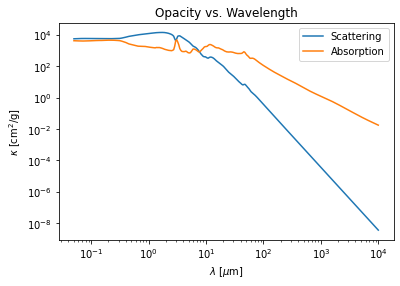

Reading dustkappa_002.inp


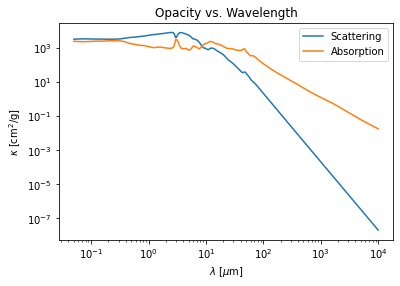

Reading dustkappa_003.inp


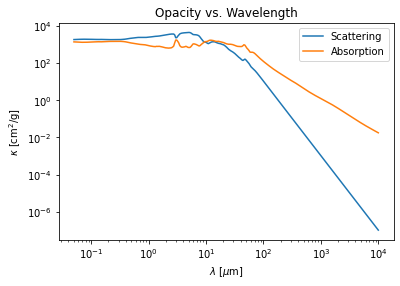

Reading dustkappa_004.inp


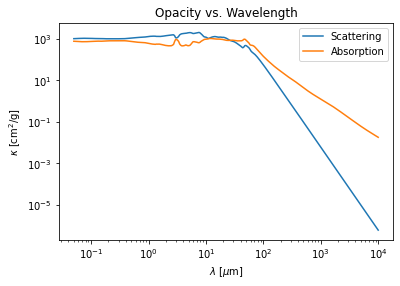

Reading dustkappa_005.inp


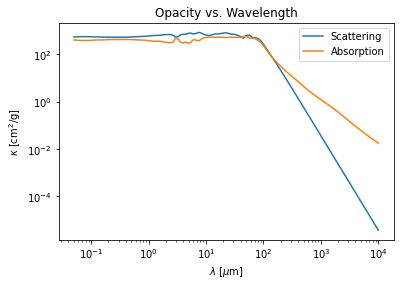

Reading dustkappa_006.inp


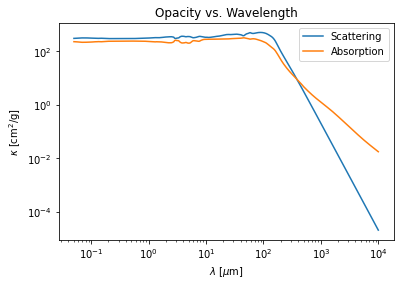

Reading dustkappa_007.inp


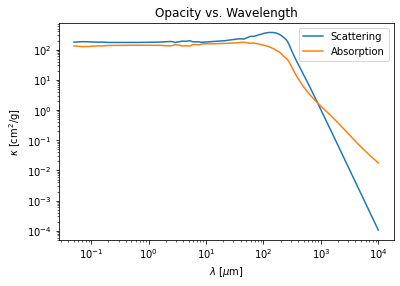

Reading dustkappa_008.inp


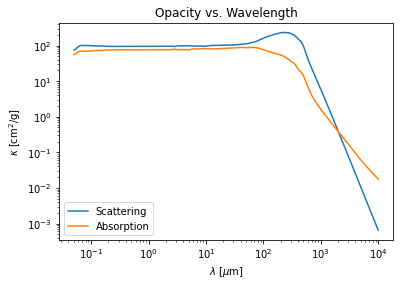

Reading dustkappa_009.inp


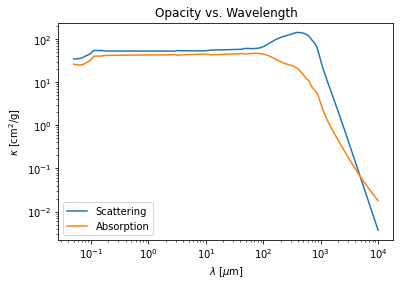

Reading dustkappa_010.inp


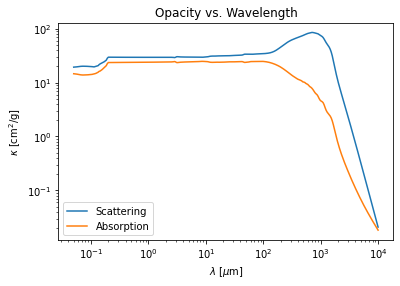

Reading dustkappa_011.inp


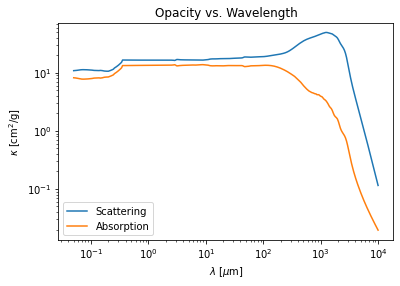

Reading dustkappa_012.inp


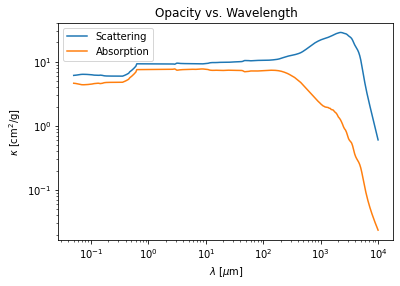

Reading dustkappa_013.inp


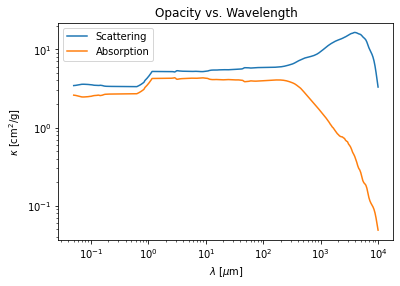

Reading dustkappa_014.inp


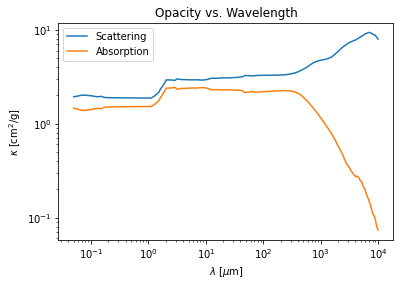

Reading dustkappa_015.inp


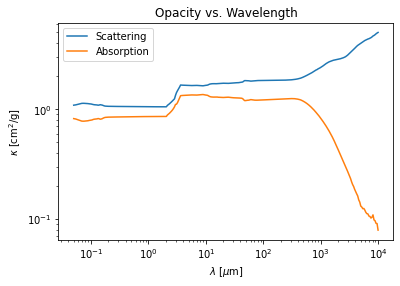

Reading dustkappa_016.inp


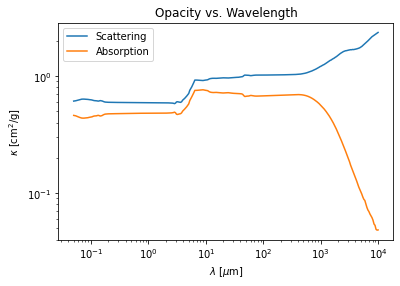

Reading dustkappa_mix.inp


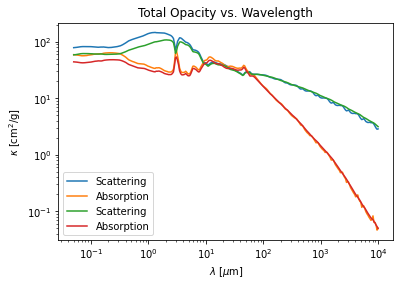

In [11]:
#Plot opacities at a given wavelength as a function of grain size for all dust materials

import radmc3dPy
dustpop_num = 16
wavelengths = [900, 1250, 1600, 2100, 3000]

Kabs_avg = np.zeros(300)
Ksca_avg = np.zeros(300)

Kabs = np.zeros((len(wavelengths), dustpop_num))
Ksca = np.zeros((len(wavelengths), dustpop_num))
for i in range(1, dustpop_num + 1):
    if i < 10:
        opac = analyze.readOpac(ext = ['00'+str(i)]) 
        m_frac = SD_Pert[0].Sd_0_all_i[i - 1][0]
        Kabs_avg += (opac.kabs[0] * rhod_i_norm[i - 1])
        Ksca_avg += (opac.ksca[0] * rhod_i_norm[i - 1])
        plt.loglog(opac.wav[0], opac.ksca[0], label = 'Scattering')
        plt.loglog(opac.wav[0], opac.kabs[0], label = 'Absorption')
        plt.xlabel(r'$\lambda$ [$\mu$m]')
        plt.ylabel('$\kappa$ [cm$^2$/g]')
        plt.title('Opacity vs. Wavelength')
        plt.legend()
        plt.show()
    else:
        opac = analyze.readOpac(ext = ['0'+str(i)])
        m_frac = SD_Pert[0].Sd_0_all_i[i - 1][0] / SD_Pert[0].Sd_0_tot[0]
        Kabs_avg += (opac.kabs[0] * rhod_i_norm[i - 1])
        Ksca_avg += (opac.ksca[0] * rhod_i_norm[i - 1])
        plt.loglog(opac.wav[0], opac.ksca[0], label = 'Scattering')
        plt.loglog(opac.wav[0], opac.kabs[0], label = 'Absorption')
        plt.xlabel(r'$\lambda$ [$\mu$m]')
        plt.ylabel('$\kappa$ [cm$^2$/g]')
        plt.title('Opacity vs. Wavelength')
        plt.legend()
        plt.show()        
    
    for j in range(0, len(wavelengths)):
            wav_to_index = np.abs(opac.wav[0] - wavelengths[j]).argmin()
            Kabs[j][i - 1] = opac.kabs[0][wav_to_index]
            Ksca[j][i - 1] = opac.ksca[0][wav_to_index]
            

opac = analyze.readOpac(ext = ['mix'])
plt.loglog(opac.wav[0], opac.ksca[0], label = 'Scattering')
plt.loglog(opac.wav[0], opac.kabs[0], label = 'Absorption')
plt.xlabel(r'$\lambda$ [$\mu$m]')
plt.ylabel('$\kappa$ [cm$^2$/g]')
plt.title('Total Opacity vs. Wavelength')
plt.legend()

plt.loglog(opac.wav[0], Ksca_avg, label = 'Scattering')
plt.loglog(opac.wav[0], Kabs_avg, label = 'Absorption')
plt.xlabel(r'$\lambda$ [$\mu$m]')
plt.ylabel('$\kappa$ [cm$^2$/g]')
plt.title('Total Opacity vs. Wavelength')
plt.legend()
plt.show()
    



In [ ]:
a_bins = np.logspace(-4, 0, 16)
for i in range(0, len(wavelengths)):
    plt.plot(a_bins, Ksca[i], label = 'Scattering')
    plt.plot(a_bins, Kabs[i], label = 'Absorption')
    plt.xlabel('Grain Size [$\mu$m]')
    plt.ylabel('Opacity [$cm^2 / g$]')
    plt.title('Opacity at '+str(wavelengths[i])+' $\mu$m vs. Grain Size')
    plt.legend()
    plt.show()

In [132]:
print(wavelengths)

[900, 1250, 1600, 2100, 3000]


In [12]:
#Define a function that returns a list with Kappa arrays dependent on ntheta and nr for each wavelength

def Kappa_func(wavelengths, dustpop_num, sigdust_total, sigdust_individual):
    Kappa_list = [[[] for j in range(0, dustpop_num)] for i in range(0, len(wavelengths))]
    for i in range(0, len(wavelengths)):
        for j in range(1, dustpop_num + 1):
            if j <= 9:
                opac = analyze.readOpac(ext = ['00'+str(int(j))]) #Chooses dust grain size bin
                wav_to_index = np.abs(opac.wav[0] - wavelengths[i]).argmin() #Calculates index for a specific wavelength
                Kappa_list[i][j - 1] = (opac.kabs[0][wav_to_index] + opac.ksca[0][wav_to_index]) * rhod_i_norm[j - 1] #Sum the opacities
            else: 
                opac = analyze.readOpac(ext = ['0'+str(int(j))])
                wav_to_index = np.abs(opac.wav[0] - wavelengths[i]).argmin() 
                Kappa_list[i][j - 1] = (opac.kabs[0][wav_to_index] + opac.ksca[0][wav_to_index]) * rhod_i_norm[j - 1]
          
    
    Kappa_total = [[np.zeros((ntheta, nr))] for i in range(0, len(wavelengths))]
    for i in range(0, len(wavelengths)):
        for j in range(0, dustpop_num):
            Kappa_total[i] += Kappa_list[i][j] * sigdust_individual[j] / sigdust_total
    

    return Kappa_total

In [59]:
#Copy dustkappa files from local linux filesystem to local windows filesystem

p.run(['cp', 'dustkappa_001.inp', 'dustkappa_002.inp', 'dustkappa_003.inp', 'dustkappa_004.inp', 'dustkappa_005.inp', 'dustkappa_006.inp', 'dustkappa_007.inp', 'dustkappa_008.inp', 'dustkappa_009.inp', 'dustkappa_010.inp', 'dustkappa_011.inp', 'dustkappa_012.inp', 'dustkappa_013.inp', 'dustkappa_014.inp', 'dustkappa_015.inp', 'dustkappa_016.inp', 'dustkappa_mix.inp', '/mnt/c/Users/evan/desktop/Protostellar_Disks'])

CompletedProcess(args=['cp', 'dustkappa_001.inp', 'dustkappa_002.inp', 'dustkappa_003.inp', 'dustkappa_004.inp', 'dustkappa_005.inp', 'dustkappa_006.inp', 'dustkappa_007.inp', 'dustkappa_008.inp', 'dustkappa_009.inp', 'dustkappa_010.inp', 'dustkappa_011.inp', 'dustkappa_012.inp', 'dustkappa_013.inp', 'dustkappa_014.inp', 'dustkappa_015.inp', 'dustkappa_016.inp', 'dustkappa_mix.inp', '/mnt/c/Users/evan/desktop/Protostellar_Disks'], returncode=0)

In [ ]:
#Create input files and create the non-perturbative density variables
NPsigmad_tot, NPsigmad_ind, NPrhod_tot, NPrhod_ind = rad_setup_FARGO(r, 0, NoPert = True, dustpop_num = dustpop_num)
NPrhod_tot = np.reshape(NPrhod_tot, (nphi, ntheta, nr))
NPrhod_ind = np.reshape(NPrhod_ind, (dustpop_num, nphi, ntheta, nr))


In [ ]:
#Copy the input files from the local Linux file system to the local Windows file system
p.run(['cp', 'amr_grid.inp', 'dust_density.inp', 'dustopac.inp', 'radmc3d.inp', 'stars.inp', 'wavelength_micron.inp', '/mnt/c/users/evan/desktop/Protostellar_Disks/NoPert'])

In [14]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from radmc3dPy.image import *
from radmc3dPy.analyze import *
from radmc3dPy.natconst import *

dpc = 260     # Distance in parsec (for conversion to Jy/pixel in 1.3 mm map)

for i in range(0, len(wavelengths)):
    #NPimage[i][1].imConv(NPimage[i][1],au=True,log=True,maxlog=3,bunit='jy/pixel',dpc=dpc,cmap='magma')
    ConvIm = Image_list[0][i].imConv(dpc=260, psfType='gauss', fwhm=[.5,.5], pa=0, tdiam_prim=8.2, tdiam_sec=0.94)
    plotImage(Image_list[0][i], au=True, log=True, maxlog=3, bunit='jy/pixel', dpc = 10, cmap='magma')
    plt.plot(Image_list[0][i].x / au, Image_list[0][i].imageJyppix[:,250,0])
    plt.xlabel('Radius [AU]')
    plt.ylabel('$S_{v}$ [Jy / pixel])')
    plt.title('Intensity at y = 0')
    plt.show()


AttributeError: 'list' object has no attribute 'imConv'

In [ ]:
p.run(['radmc3d', 'image', 'incl', '0', 'phi', '0', 'npix', '500', 'lambda', '900', 'setthreads', '8'])

In [19]:
# sig_tot_list = [[] for i in range(0, len(SD_Pert))]
# sig_ind_list = [[] for i in range(0, len(SD_Pert))]
temp_list = [[] for i in range(0, len(SD_Pert))]
# rhod_tot_list = [[] for i in range(0, len(SD_Pert))]
# rhod_ind_list = [[] for i in range(0, len(SD_Pert))]
Kappa_list = [[] for i in range(0, len(SD_Pert))]
Image_list = [[] for i in range(0, len(SD_Pert))]

In [18]:
#Create Input files
for i in range(0, dustpop_num):
    PertIndex = i
    sigmad_tot, sigmad_ind, rhod_tot, rhod_ind = rad_setup_FARGO(r, PertIndex, NoPert = False, dustpop_num = dustpop_num) 
    rhod_tot = np.reshape(rhod_tot, (nphi, ntheta, nr))
    rhod_ind = np.reshape(rhod_ind, (dustpop_num, nphi, ntheta, nr))
    sig_tot_list[PertIndex] = sigmad_tot
    sig_ind_list[PertIndex] = sigmad_ind
    rhod_tot_list[PertIndex] = rhod_tot
    rhod_ind_list[PertIndex] = rhod_ind
    #Copy the input files from the local Linux file system to the local Windows file system
    #p.run(['cp', 'amr_grid.inp', 'dust_density.inp', 'dustopac.inp', 'radmc3d.inp', 'stars.inp', 'wavelength_micron.inp', '/mnt/c/users/evan/desktop/Protostellar_Disks/Pert'+str(i)])

In [20]:
#Copy and analyze output files from the Windows filesystem
p.run(['cp', '/mnt/c/users/evan/desktop/Protostellar_Disks/NoPert/radmc3d.out', '/mnt/c/users/evan/desktop/Protostellar_Disks/NoPert/dust_temperature.dat', './'])
data = analyze.readData()
NPtemp = np.average(np.transpose(data.dusttemp), axis = 1)
NPkappa = Kappa_func(wavelengths, dustpop_num, NPsigmad_tot, NPsigmad_ind)
NPimage = [[] for i in range(0, len(wavelengths))]
for i in range(0, len(wavelengths)):
    p.run(['cp', '/mnt/c/users/evan/desktop/Protostellar_Disks/NoPert/lambda'+str(wavelengths[i])+'/image.out', './'])
    im = image.readImage()
    NPimage[i] = im
    p.run(['cp', 'image.out', 'lambda'+str(wavelengths[i])])
for i in range(0, dustpop_num):
    p.run(['cp', '/mnt/c/users/evan/desktop/Protostellar_Disks/Pert'+str(i)+'/radmc3d.out', '/mnt/c/users/evan/desktop/Protostellar_Disks/Pert'+str(i)+'/dust_temperature.dat', './'])
    data = analyze.readData()
    temp_list[i] = np.average(np.transpose(data.dusttemp), axis = 1)
    Kappa_list[i] = Kappa_func(wavelengths, dustpop_num, sig_tot_list[i], sig_ind_list[i])
    Images = [[] for j in range(0, len(wavelengths))]
    for j in range(0, len(wavelengths)):
        p.run(['cp', '/mnt/c/users/evan/desktop/Protostellar_Disks/Pert'+str(i)+'/lambda'+str(wavelengths[j])+'/image.out', './'])
        im = image.readImage()
        Images[j] = im
        
    Image_list[i] = Images

Reading amr_grid.inp
Reading wavelength_micron.inp
Reading dust_density.inp
Reading dust_temperature.dat
Reading dustkappa_001.inp
Reading dustkappa_002.inp
Reading dustkappa_003.inp
Reading dustkappa_004.inp
Reading dustkappa_005.inp
Reading dustkappa_006.inp
Reading dustkappa_007.inp
Reading dustkappa_008.inp
Reading dustkappa_009.inp
Reading dustkappa_010.inp
Reading dustkappa_011.inp
Reading dustkappa_012.inp
Reading dustkappa_013.inp
Reading dustkappa_014.inp
Reading dustkappa_015.inp
Reading dustkappa_016.inp
Reading dustkappa_001.inp
Reading dustkappa_002.inp
Reading dustkappa_003.inp
Reading dustkappa_004.inp
Reading dustkappa_005.inp
Reading dustkappa_006.inp
Reading dustkappa_007.inp
Reading dustkappa_008.inp
Reading dustkappa_009.inp
Reading dustkappa_010.inp
Reading dustkappa_011.inp
Reading dustkappa_012.inp
Reading dustkappa_013.inp
Reading dustkappa_014.inp
Reading dustkappa_015.inp
Reading dustkappa_016.inp
Reading dustkappa_001.inp
Reading dustkappa_002.inp
Reading dus

cp: cannot stat '/mnt/c/users/evan/desktop/Protostellar_Disks/Pert15/lambda900/image.out': No such file or directory


Reading image.out


cp: cannot stat '/mnt/c/users/evan/desktop/Protostellar_Disks/Pert15/lambda1250/image.out': No such file or directory


Reading image.out


cp: cannot stat '/mnt/c/users/evan/desktop/Protostellar_Disks/Pert15/lambda1600/image.out': No such file or directory


Reading image.out


cp: cannot stat '/mnt/c/users/evan/desktop/Protostellar_Disks/Pert15/lambda2100/image.out': No such file or directory


Reading image.out


cp: cannot stat '/mnt/c/users/evan/desktop/Protostellar_Disks/Pert15/lambda3000/image.out': No such file or directory


Reading image.out


In [22]:
#Save parameter search data to local storage

import shelve

with shelve.open('RadmcDB_FARGO', 'c') as f:
    f['NPsigmad_tot'] = NPsigmad_tot
    f['NPsigmad_ind'] = NPsigmad_ind
    f['NPtemp'] = NPtemp
    f['NPrhod_tot'] = NPrhod_tot
    f['NPkappa'] = NPkappa
    f['NPimage'] = NPimage
    f['sig_tot_list'] = sig_tot_list
    f['sig_ind_list'] = sig_ind_list
    f['temp_list'] = temp_list
    f['rhod_tot_list'] = rhod_tot_list
    f['rhod_ind_list'] = rhod_ind_list
    f['Kappa_list'] = Kappa_list
    f['Image_list'] = Image_list
    
f.close()

In [3]:
#Pull parameter search data from local storage

import shelve

f = shelve.open('RadmcDB_FARGO')

NPsigmad_tot = f['NPsigmad_tot']  
NPsigmad_ind = f['NPsigmad_ind'] 
NPtemp = f['NPtemp']
NPrhod_tot = f['NPrhod_tot']
NPkappa = f['NPkappa']
NPimage = f['NPimage'] 
sig_tot_list = f['sig_tot_list'] 
sig_ind_list = f['sig_ind_list']
temp_list = f['temp_list'] 
rhod_tot_list = f['rhod_tot_list'] 
rhod_ind_list = f['rhod_ind_list'] 
Kappa_list = f['Kappa_list']
Image_list = f['Image_list'] 

In [5]:
print(np.shape(NPimage))

NameError: name 'np' is not defined

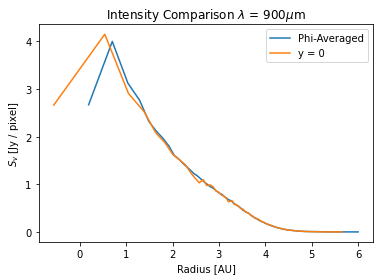

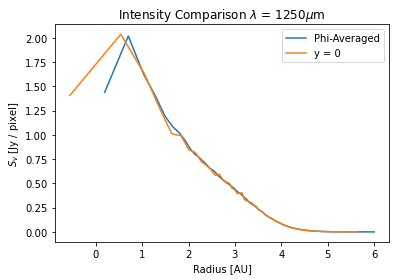

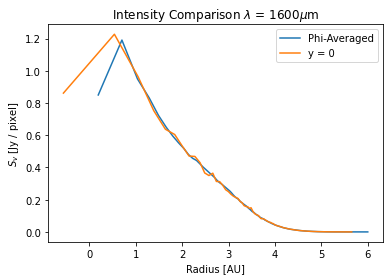

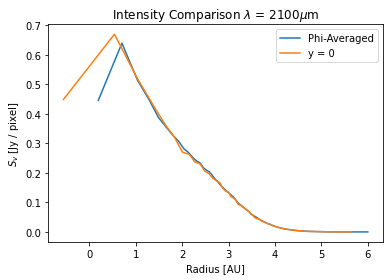

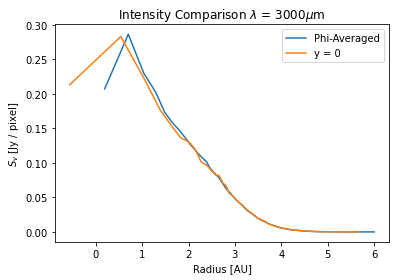

In [26]:
#Binned Statistic Method for no perturbation

from scipy import stats

ConvIm = NPimage[0].imConv(dpc=260, psfType='gauss', fwhm=[.1,.1], pa=0, tdiam_prim=8.2, tdiam_sec=0.94)
radmc_gridx = ConvIm.x
radmc_gridy = ConvIm.y

#Convert cartesian values to (r, phi) values
rphi_values = np.empty((len(radmc_gridx)*len(radmc_gridy), 2))
for i in range(0, len(radmc_gridx)):
    for j in range(0, len(radmc_gridy)):
        rphi_values[i*len(radmc_gridx) + j][0] = float(np.sqrt(radmc_gridx[i]**2 + radmc_gridy[j]**2) / au)
        rphi_values[i*len(radmc_gridx) + j][1] = float(np.arctan(radmc_gridy[j] / radmc_gridx[i]))


for k in range(0, len(wavelengths)):
    ConvIm = NPimage[k].imConv(dpc=260, psfType='gauss', fwhm=[.1,.1], pa=0, tdiam_prim=8.2, tdiam_sec=0.94)
    
    
    #Change the shape of the image array
    jyppix_image = np.empty(len(radmc_gridx)*len(radmc_gridy))
    for i in range(0, len(radmc_gridx)):
        for j in range(0, len(radmc_gridy)):
            jyppix_image[i*len(radmc_gridx) + j] = NPimage[k].imageJyppix[i, j, 0]

    #Average the radiation intensity across the radial bins
    jyppix_binned = stats.binned_statistic(rphi_values[:,0], jyppix_image, statistic = 'mean', bins = 500)

    #Calculate radial bin centers
    bin_centers = np.empty(len(jyppix_binned[1]) - 1)
    for i in range(0, len(jyppix_binned[1]) - 1):
        bin_centers[i] = (jyppix_binned[1][i] + jyppix_binned[1][i + 1]) / 2


    plt.plot(np.log(bin_centers), jyppix_binned[0], label = 'Phi-Averaged')
    plt.plot(np.log((NPimage[k].x / au)[250:501]), NPimage[k].imageJyppix[250:501,250,0], label = 'y = 0')
    #plt.plot((ConvIm.x / au)[250:501], ConvIm.imageJyppix)
    plt.legend()
    plt.xlabel('Radius [AU]')
    plt.ylabel('$S_{v}$ [Jy / pixel] ')
    plt.title('Intensity Comparison $\lambda$ = '+str(wavelengths[k])+'$\mu$m')
    plt.show()

# for i in range(0, len(rphi_values)):
#     print(rphi_values[i])

# #Map the (r, phi) values to (x, y) values
# x_image = np.empty((int(len(r_image)), int(len(phi_values))))
# y_image = np.empty((int(len(r_image)), int(len(phi_values))))
# for i in range(0, len(r_image)):
#     for j in range(0, len(phi_values)):
#         x_image[i][j] = r_image[i]*np.cos(phi_values[j])
#         y_image[i][j] = r_image[i]*np.sin(phi_values[j])
        
                   
# #Arange the radmc3d grid into the required shape 
# cartesian_points = np.empty((len(radmc_gridx)**2, 2))
# for i in range(0, len(radmc_gridx)):
#     for j in range(0, len(radmc_gridx)):
#             cartesian_points[len(radmc_gridx)*i + j][0] = radmc_gridx[j] / au
#             cartesian_points[len(radmc_gridx)*i + j][1] = radmc_gridy[i] / au
            
# for i in range(0, len(wavelengths)):
#     ConvIm = NPimage[i][1].imConv(dpc=260, psfType='gauss', fwhm=[.1,.1], pa=0, tdiam_prim=8.2, tdiam_sec=0.94)

#     #Flatten the 500x500 image array to correspond to the cartesian_points array       
#     ConvIm_values = np.empty(len(radmc_gridx)**2)
#     for j in range(0, len(radmc_gridx)):
#         for k in range(0, len(radmc_gridx)):
#             ConvIm_values[len(radmc_gridx)*j + k] = ConvIm.imageJyppix[k, j, 0]

#     Image_interp = sp.interpolate.griddata(cartesian_points, ConvIm_values, (x_image, y_image), method = 'nearest')
#     Image_phi_avg = np.average(Image_interp, axis = 1)

#     plt.plot(r_values, np.log(Image_phi_avg), label = 'Phi-Averaged')
#     plt.plot((ConvIm.x / au)[250:501], np.log(ConvIm.imageJyppix[250:501,250,0]), label = 'y = 0')
#     plt.legend()
#     plt.xlabel('Radius [AU]')
#     plt.ylabel('log($S_{v}$ [Jy / pixel]) ')
#     plt.title('Intensity Comparison $\lambda$ = '+str(wavelengths[i])+'$\mu$m')
#     plt.show()

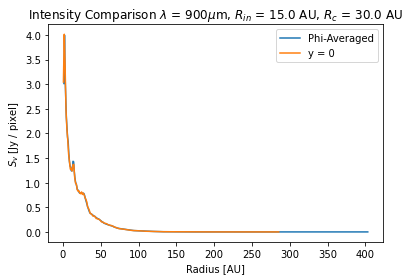

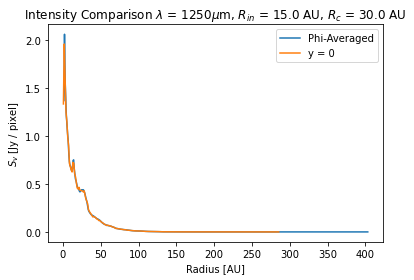

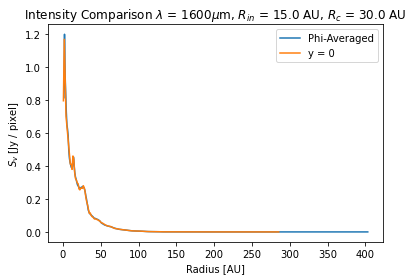

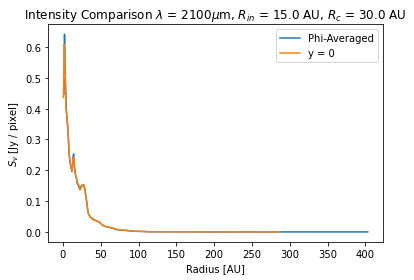

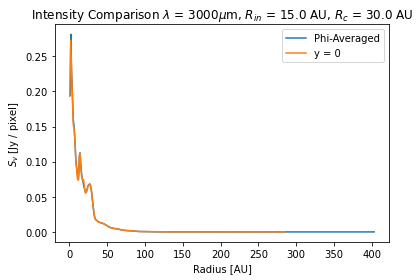

...

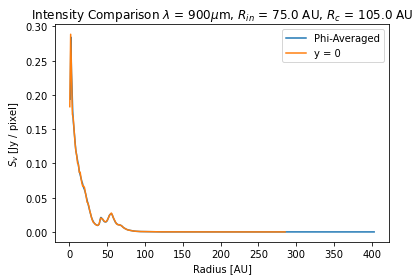

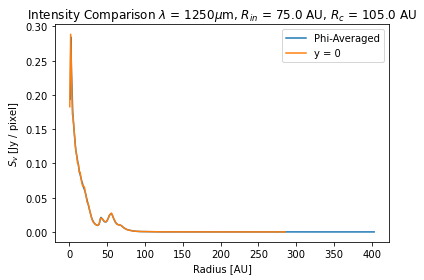

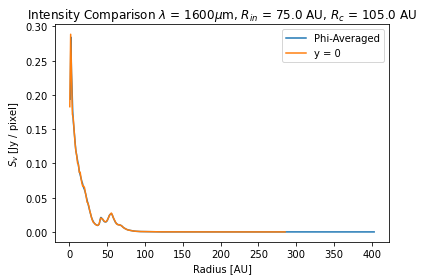

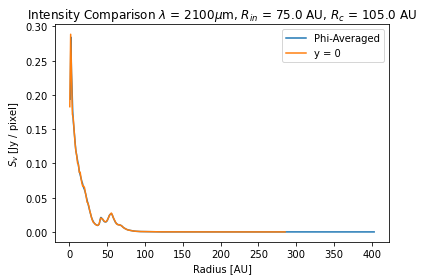

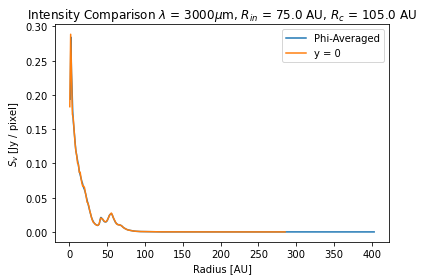

In [27]:
#Binned Statistic Method for perturbations

from scipy import stats

#Define cartesian coordinates
ConvIm = NPimage[0].imConv(dpc=260, psfType='gauss', fwhm=[.1,.1], pa=0, tdiam_prim=8.2, tdiam_sec=0.94)
radmc_gridx = ConvIm.x
radmc_gridy = ConvIm.y

#Convert cartesian values to (r, phi) values
rphi_values = np.empty((len(radmc_gridx)*len(radmc_gridy), 2))
for i in range(0, len(radmc_gridx)):
    for j in range(0, len(radmc_gridy)):
        rphi_values[i*len(radmc_gridx) + j][0] = float(np.sqrt(radmc_gridx[i]**2 + radmc_gridy[j]**2) / au)
        rphi_values[i*len(radmc_gridx) + j][1] = float(np.arctan(radmc_gridy[j] / radmc_gridx[i]))

bin_center_list = [[[] for j in range(0, len(wavelengths))] for i in range(0, len(SD_Pert))]
jyppix_binned_list = [[[] for j in range(0, len(wavelengths))] for i in range(0, len(SD_Pert))]
for i in range(0, len(SD_Pert)):
    for j in range(0, len(wavelengths)):
        ConvIm = Image_list[i][j].imConv(dpc=260, psfType='gauss', fwhm=[.1,.1], pa=0, tdiam_prim=8.2, tdiam_sec=0.94)

        radmc_gridx = Image_list[i][j].x
        radmc_gridy = Image_list[i][j].y

        #Convert cartesian values to (r, phi) values
        rphi_values = np.empty((len(radmc_gridx)*len(radmc_gridy), 2))
        for k in range(0, len(radmc_gridx)):
            for l in range(0, len(radmc_gridy)):
                rphi_values[k*len(radmc_gridx) + l][0] = float(np.sqrt(radmc_gridx[k]**2 + radmc_gridy[l]**2) / au)
                rphi_values[k*len(radmc_gridx) + l][1] = float(np.arctan(radmc_gridy[k] / radmc_gridx[l]))
        
        #Change the shape of the image array
        jyppix_image = np.empty(len(radmc_gridx)*len(radmc_gridy))
        for k in range(0, len(radmc_gridx)):
            for l in range(0, len(radmc_gridy)):
                jyppix_image[k*len(radmc_gridx) + l] = Image_list[i][j].imageJyppix[k, l, 0]

        #Average the radiation intensity across the radial bins
        jyppix_binned = stats.binned_statistic(rphi_values[:,0], jyppix_image, statistic = 'mean', bins = 500)
        jyppix_binned_list[i][j] = jyppix_binned[0]

        #Calculate radial bin centers
        bin_centers = np.empty(len(jyppix_binned[1]) - 1)
        for k in range(0, len(jyppix_binned[1]) - 1):
            bin_centers[k] = (jyppix_binned[1][k] + jyppix_binned[1][k + 1]) / 2
            
        bin_center_list[i][j] = bin_centers
            
        
for i in range(0, len(SD_Pert)):
    for j in range(0, len(wavelengths)):
        plt.plot(bin_center_list[i][j], jyppix_binned_list[i][j], label = 'Phi-Averaged')
        plt.plot((Image_list[i][j].x / au)[250:501], Image_list[i][j].imageJyppix[250,250:501,0], label = 'y = 0')
        plt.legend()
        plt.xlabel('Radius [AU]')
        plt.ylabel('$S_{v}$ [Jy / pixel] ')
        plt.title('Intensity Comparison $\lambda$ = '+str(wavelengths[j])+'$\mu$m, $R_{in}$ = '+str(Rin_list[i])+' AU, $R_c$ = '+str(Rc_list[i])+' AU')
        plt.show()

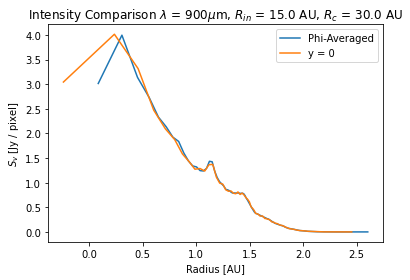

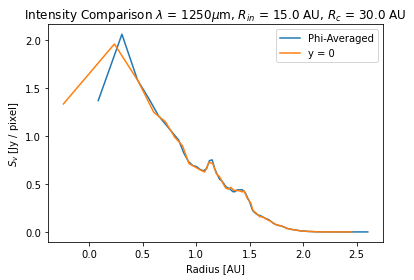

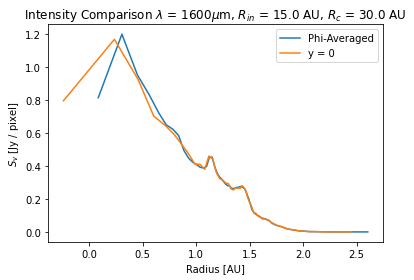

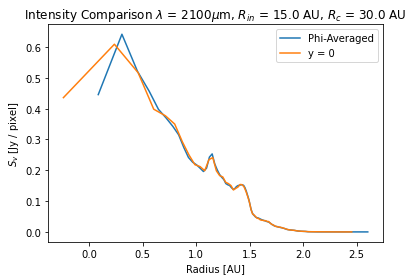

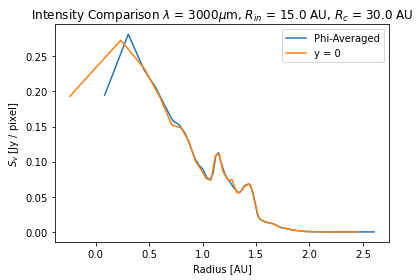

...

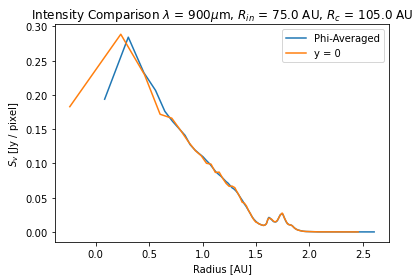

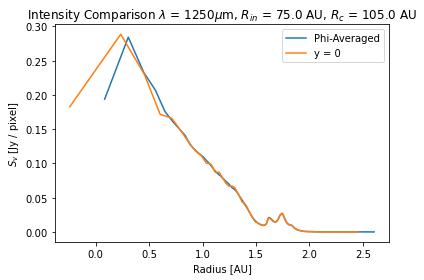

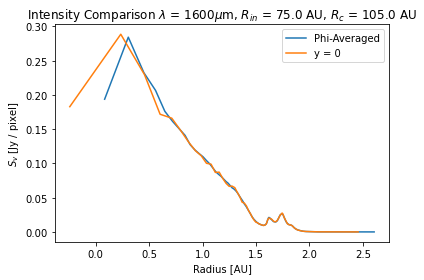

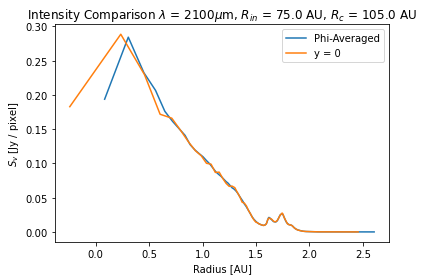

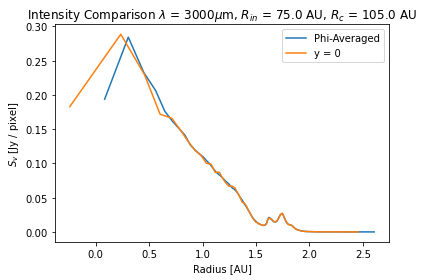

In [30]:
for i in range(0, len(SD_Pert)):
    for j in range(0, len(wavelengths)):
        plt.plot(np.log10(bin_center_list[i][j]), jyppix_binned_list[i][j], label = 'Phi-Averaged')
        plt.plot(np.log10((Image_list[i][j].x / au)[250:501]), Image_list[i][j].imageJyppix[250,250:501,0], label = 'y = 0')
        plt.legend()
        plt.xlabel('Radius [AU]')
        plt.ylabel('$S_{v}$ [Jy / pixel] ')
        plt.title('Intensity Comparison $\lambda$ = '+str(wavelengths[j])+'$\mu$m, $R_{in}$ = '+str(Rin_list[i])+' AU, $R_c$ = '+str(Rc_list[i])+' AU')
        plt.show()

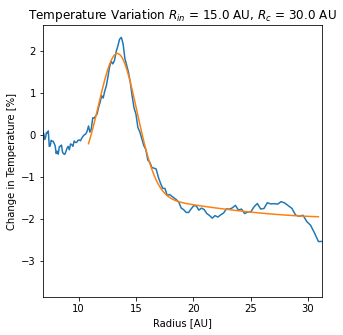

Fit Equation: 3.29exp(-(R - 13.4)**2 / 2*1.67**2) + -1.96exp(-(R - 33.5)**2 / 2*23.5**2
Maximum Value: 1.9347067641389495
236
Minimum Value: -1.9438114212182733
309


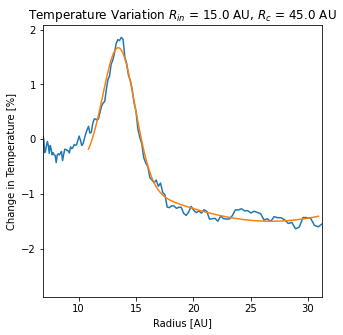

Fit Equation: 2.46exp(-(R - 13.5)**2 / 2*1.41**2) + -1.5exp(-(R - 26.8)**2 / 2*11.7**2
Maximum Value: 1.6695497639980994
236
Minimum Value: -1.499639132686399
303


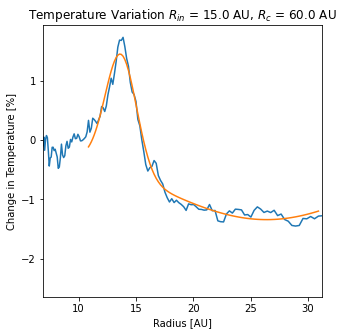

Fit Equation: 1.99exp(-(R - 13.7)**2 / 2*1.37**2) + -1.34exp(-(R - 26.4)**2 / 2*9.5**2
Maximum Value: 1.4450443778843556
237
Minimum Value: -1.34155807848663
303


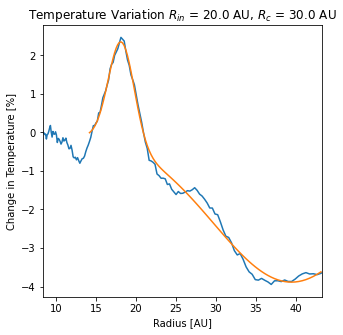

Fit Equation: 2.71exp(-(R - 18.2)**2 / 2*1.62**2) + -3.89exp(-(R - 39.5)**2 / 2*9.77**2
Maximum Value: 2.351172988050253
261
Minimum Value: -3.8857366543569665
325


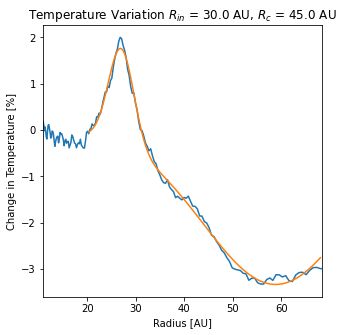

Fit Equation: 2.1exp(-(R - 26.9)**2 / 2*2.62**2) + -3.33exp(-(R - 58.8)**2 / 2*15.0**2
Maximum Value: 1.764704465801499
296
Minimum Value: -3.3332679723103436
363


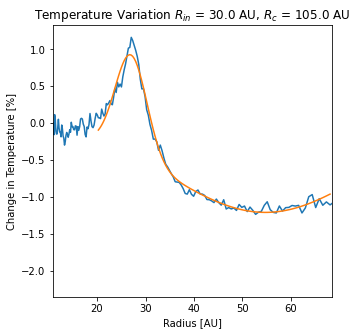

Fit Equation: 1.37exp(-(R - 27.0)**2 / 2*3.29**2) + -1.21exp(-(R - 54.7)**2 / 2*19.7**2
Maximum Value: 0.9273532853289976
297
Minimum Value: -1.209553011127938
357


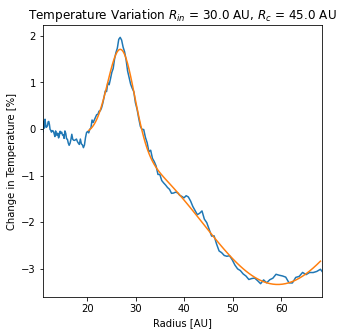

Fit Equation: 2.08exp(-(R - 26.9)**2 / 2*2.75**2) + -3.33exp(-(R - 59.3)**2 / 2*15.5**2
Maximum Value: 1.7089386323537854
296
Minimum Value: -3.3342498731818377
362


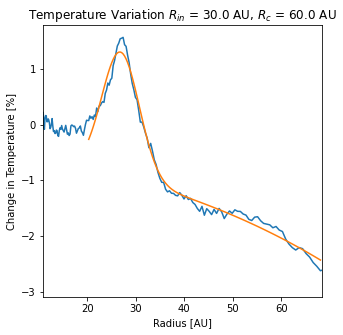

Fit Equation: 2.25exp(-(R - 26.8)**2 / 2*3.88**2) + -63.1exp(-(R - 370.0)**2 / 2*119.0**2
Maximum Value: 1.304205654882749
298
Minimum Value: -2.4336381820392092
380


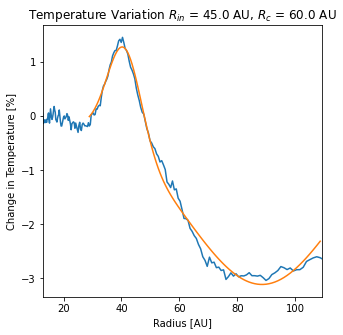

Fit Equation: 1.86exp(-(R - 41.0)**2 / 2*5.86**2) + -3.11exp(-(R - 88.5)**2 / 2*26.1**2
Maximum Value: 1.281990029377932
333
Minimum Value: -3.1111260148190025
405


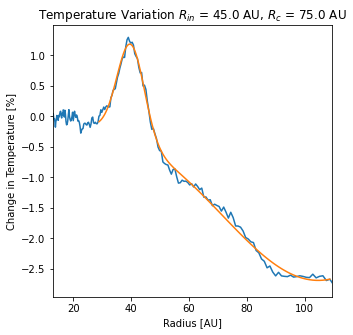

Fit Equation: 1.57exp(-(R - 39.9)**2 / 2*4.69**2) + -2.69exp(-(R - 105.0)**2 / 2*32.9**2
Maximum Value: 1.1844593701150776
330
Minimum Value: -2.6879576229522772
421


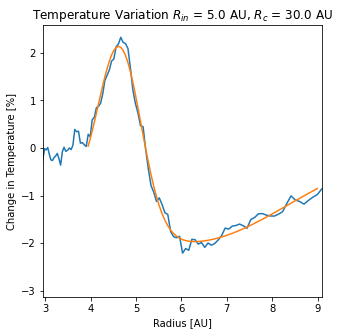

Fit Equation: 3.7exp(-(R - 4.65)**2 / 2*0.472**2) + -1.98exp(-(R - 6.14)**2 / 2*2.2**2
Maximum Value: 2.133927018395224
139
Minimum Value: -1.9656245866811655
162


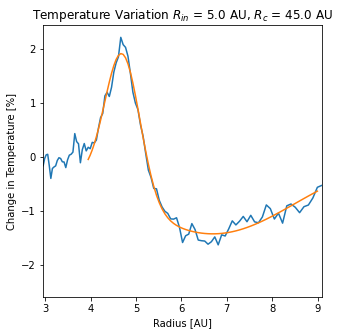

Fit Equation: 2.68exp(-(R - 4.7)**2 / 2*0.388**2) + -1.42exp(-(R - 6.69)**2 / 2*1.81**2
Maximum Value: 1.9108152372987992
139
Minimum Value: -1.4222936894979608
173


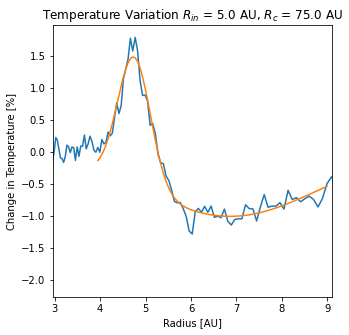

Fit Equation: 2.02exp(-(R - 4.75)**2 / 2*0.361**2) + -1.01exp(-(R - 6.86)**2 / 2*1.91**2
Maximum Value: 1.4802503217809826
141
Minimum Value: -1.0070314753732508
162


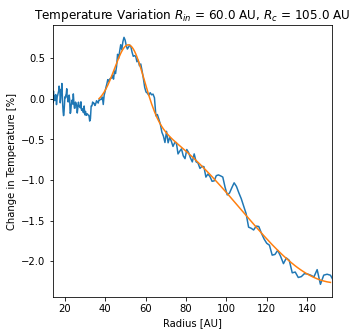

Fit Equation: 0.873exp(-(R - 52.0)**2 / 2*7.26**2) + -2.27exp(-(R - 155.0)**2 / 2*47.3**2
Maximum Value: 0.6631598448865398
351
Minimum Value: -2.260258405333991
449


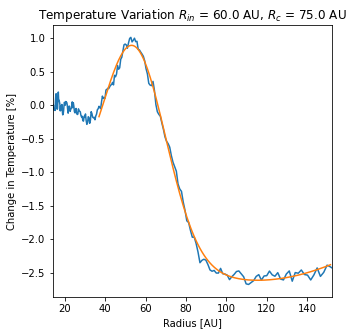

Fit Equation: 2.93exp(-(R - 54.5)**2 / 2*15.7**2) + -2.61exp(-(R - 114.0)**2 / 2*86.0**2
Maximum Value: 0.8905778303572469
357
Minimum Value: -2.6130107939066
424


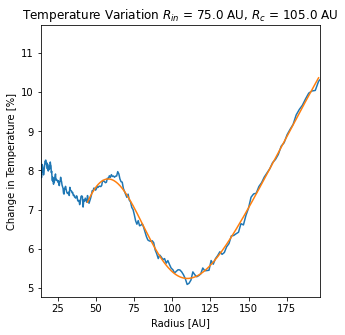

Fit Equation: 13.9exp(-(R - 283.0)**2 / 2*114.0**2) + 5.89exp(-(R - 53.2)**2 / 2*29.0**2
Maximum Value: 10.364612074845216
475
Minimum Value: 5.244751971451373
341


In [200]:
#Temperature Variation Plots

from scipy.optimize import curve_fit
T_max = np.empty(len(SD_Pert))
T_min = np.empty(len(SD_Pert)) 
T_amp1 = np.empty(len(SD_Pert))
T_loc1 = np.empty(len(SD_Pert))
T_width1 = np.empty(len(SD_Pert))
T_amp2 = np.empty(len(SD_Pert))
T_loc2 = np.empty(len(SD_Pert)) 
T_width2 = np.empty(len(SD_Pert))
for i in range(0, len(SD_Pert)):
    
    x = data.grid.x/natconst.au
    l = Rin_list[i]

    #The index of x which corresponds to the value in x closest to the location of the perturbation
    l_index = np.abs(x - l).argmin()
    width = hp[l_index]

    #Create a loop to find an equally spaced interval on either side of the perturbation
    for backward in range(1, l_index): 
        if abs(x[l_index] - x[l_index - backward]) <= 5*width / au: 
            pass
        else:
            B = backward
            break

    for forward in range(1, len(x) - l_index):
        if abs(x[l_index] - x[l_index + forward]) <= 20*width / au:
            pass
        else:
            F = forward
            break
        
    temp = np.average(temp_list[i], axis = 0)
    temp_for_avg = [[] for k in range(0, 20)]
    NPtemp_for_avg = [[] for k in range(0, 20)]
    for k in range(-21, -1):
        temp_for_avg[k + 20] = temp[k]
        NPtemp_for_avg[k + 20] = np.average(NPtemp, axis = 0)[k]
        
    temp_avg = np.sum(temp_for_avg, axis = 0) / len(temp_for_avg)
    NPtemp_avg = np.sum(NPtemp_for_avg, axis = 0) / len(NPtemp_for_avg)
    Tvar_avg = 100*(temp_avg - NPtemp_avg) / NPtemp_avg
    plt.figure(figsize = (5,5))
    plt.plot(r / au, Tvar_avg)
    plt.title('Temperature Variation $R_{in}$ = '+str(Rin_list[i])+' AU, $R_c$ = '+str(Rc_list[i])+' AU')
    plt.xlabel('Radius [AU]')
    plt.ylabel('Change in Temperature [%]')
    plt.xlim((l - 10*width / au), (l + 20*width / au))
    
    #Find the maximum value of the data in the desired range
    max_value = 0
    index = l_index - B
    max_index = l_index - B
    for n in Tvar_avg[(l_index - B):(l_index + F)]:
        index = index + 1
        if n > max_value:
            max_value = n
            max_index = index
        else:
            pass


    #Find the minimum value of the data in the desired range
    min_value = 0
    index = l_index - B
    min_index = l_index - B
    for n in Tvar_avg[(l_index - B):(l_index + F)]:
        index = index + 1
        if n < min_value:
            min_value = n
            min_index = index
        else:
            pass

    #Define a function form for curve-fitting
    def fit_form(dist, a, b, c, d, e, f):
        return a*np.exp(-(dist - b)**2 / (2*c**2)) + d*np.exp(-(dist - e)**2 / (2*f**2)) #+ g

    #Focus on the data in the desired range
    xdata = x[(l_index - B):(l_index + F)] #Save
    ydata = Tvar_avg[(l_index - B):(l_index + F)] #Save
    p0 = [max_value, x[max_index], width / au, min_value, x[min_index], width / au]
    bounds = [[max_value - max_value / 4, -np.inf, .5*width / au, -np.inf, -np.inf, -np.inf], [max_value + max_value / 4, np.inf, 4*width / au, 20, 200, 200]]
    popt, pcov = curve_fit(fit_form, xdata, ydata, p0 = p0, maxfev = 1000000)
    plt.plot(xdata, fit_form(xdata, *popt))
    plt.show()

    #Define a function for shortening parameter lengths
    def round_func(num):
        return str(round(num, 2-int(np.floor(np.log10(abs(num))))))

    #Find the extrema of the fit and append to T_max
    fit_max = np.max(fit_form(xdata, *popt))
    fit_min = np.min(fit_form(xdata, *popt))
    T_max[i] = fit_max
    T_min[i] = fit_min

    a, b, c, d, e, f= popt
    T_amp1[i] = a
    T_loc1[i] = b
    T_width1[i] = c
    T_amp2[i] = d
    T_loc2[i] = e
    T_width2[i] = f                                                                                   
    print('Fit Equation: '+round_func(a)+'exp(-(R - '+round_func(b)+')**2 / 2*'+round_func(c)+'**2) + '+round_func(d)+'exp(-(R - '+round_func(e)+')**2 / 2*'+round_func(f)+'**2')# + '+round_func(g))
    print("Maximum Value: " +str(fit_max))
    print(max_index)
    print("Minimum Value: " +str(fit_min))
    print(min_index)
    
    
        

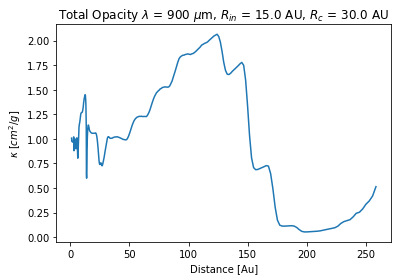

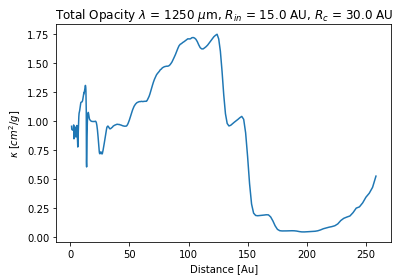

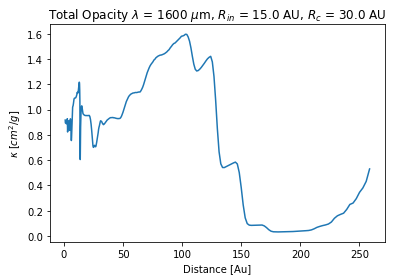

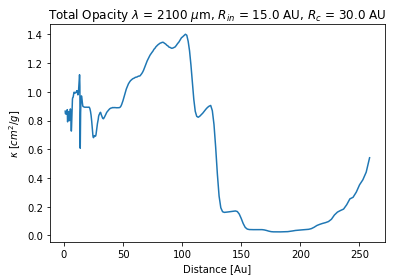

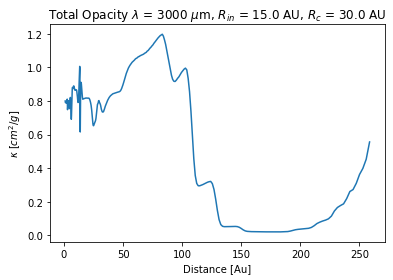

...

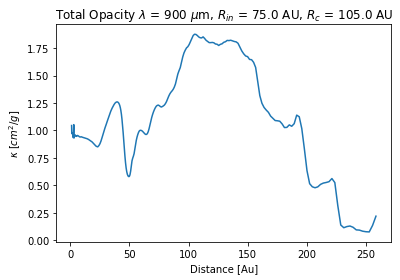

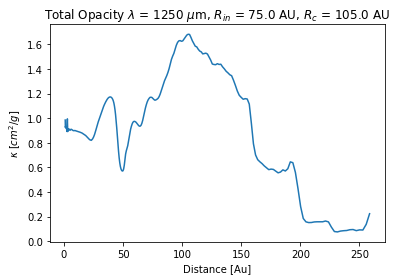

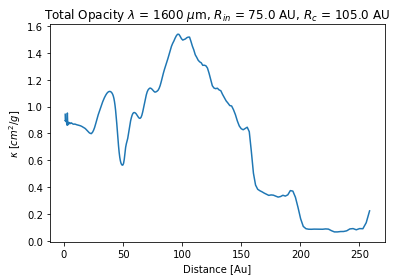

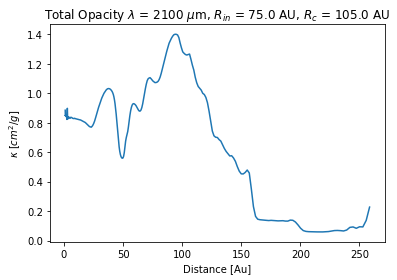

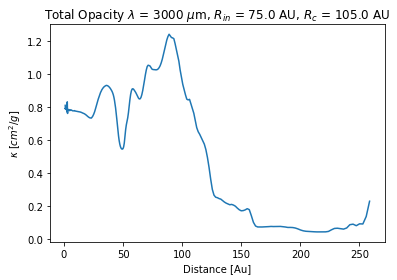

In [201]:
for i in range(0, len(SD_Pert)):
    for j in range(0, len(wavelengths)):
        Kappa_for_mean = [[] for k in range(0, 20)]
        for k in range(-21, -1):
            Kappa_for_mean[k + 21] = Kappa_list[i][j][0][k]
            
        Kappa_mean = np.sum(Kappa_for_mean, axis = 0) / len(Kappa_for_mean)
        
        
        plt.xlabel('Distance [Au]')
        plt.ylabel('$\kappa$ [$cm^2/g$]')
        plt.title('Total Opacity $\lambda$ = '+str(wavelengths[j])+' $\mu$m, $R_{in}$ = '+str(Rin_list[i])+' AU, $R_c$ = '+str(Rc_list[i])+' AU')
        plt.plot(r / au, Kappa_mean)
        plt.show()

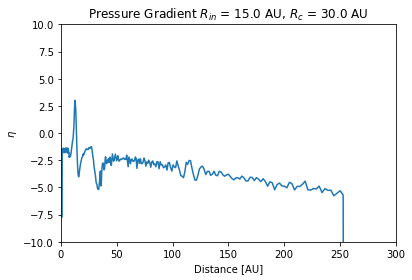

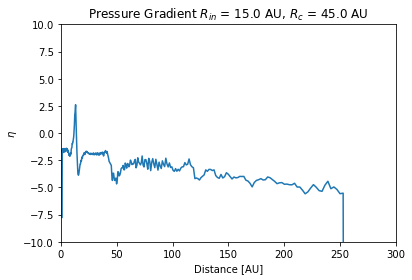

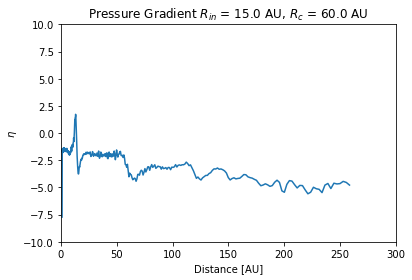

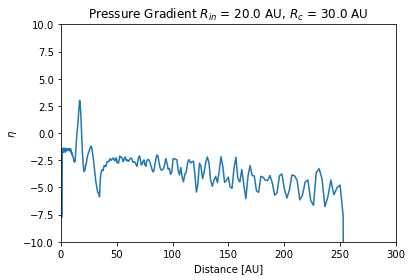

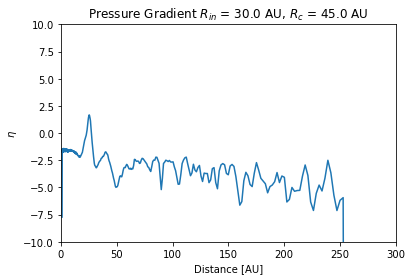

...

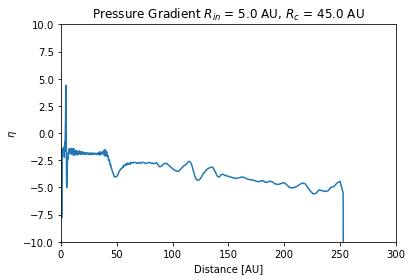

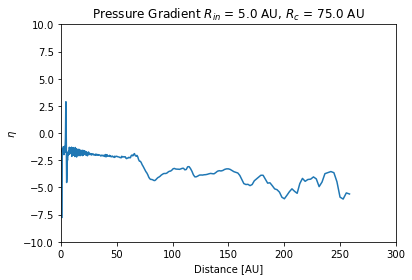

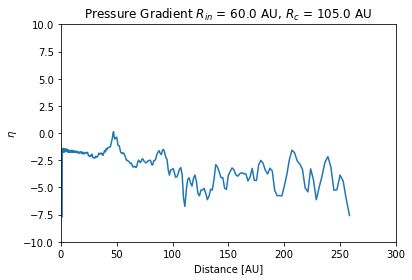

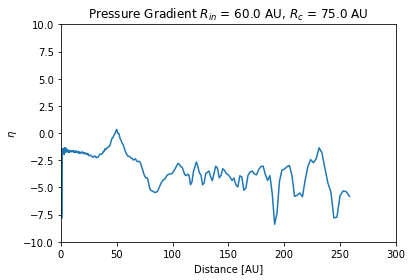

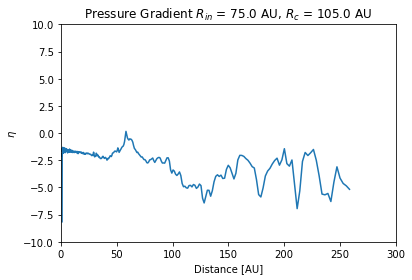

In [31]:
from scipy.optimize import curve_fit
def Eta(H, Sigma_gas, T, R): #Define parameterized pressure gradient function
    return ((1 / 2) * (H / R)**2)*0 + (np.gradient(np.log(Sigma_gas)) / np.gradient(np.log(R)) + np.gradient(np.log(T)) / np.gradient(np.log(R)))

for i in range(0, len(SD_Pert)):
    
    x = data.grid.x/natconst.au
    l = Rin_list[i]
    
    
    #The index of x which corresponds to the value in x closest to the location of the perturbation
    l_index = np.abs(x - l).argmin()
    width = hp[l_index]

    #Create a loop to find an equally spaced interval on either side of the perturbation
    for backward in range(1, l_index): 
        if abs(x[l_index] - x[l_index - backward]) <= 5*width / au: 
            pass
        else:
            B = backward
            break

    for forward in range(1, len(x) - l_index):
        if abs(x[l_index] - x[l_index + forward]) <= ((Rc_list[i] - Rin_list[i]) + 5*width / au):
            pass
        else:
            F = forward
            break

    if (l_index + F) > len(x):
        break
    else:
        pass

    #Calculate the mean temperature over the first 20 values in the angular direction
    temp = np.average(temp_list[i], axis = 0)
    temp_for_avg = [[] for k in range(0, 20)]
    for k in range(-21, -1):
        temp_for_avg[k + 20] = temp[k]
        
    temp_avg = np.sum(temp_for_avg, axis = 0) / len(temp_for_avg)

    H = hp / au#[(l_index - B):(l_index + F)] / au
    Sigma_gas = SD_Pert[i].Sg_p_tot_i#[(l_index - B):(l_index + F)]
    T = temp_avg#[(l_index - B):(l_index + F)]
    R = x#[(l_index - B):(l_index + F)]

    plt.plot(R, Eta(H, Sigma_gas, T, R))
    plt.xlabel('Distance [AU]')
    plt.ylabel('$\eta$')
    plt.xlim(0, 300)
    plt.ylim(-10, 10)
    plt.title('Pressure Gradient $R_{in}$ = '+str(Rin_list[i])+' AU, $R_c$ = '+str(Rc_list[i])+' AU')
    plt.show()


    #Find the maximum value of the data in the desired range
    max_value = 0
    index = l_index - B
    max_index = l_index - B
    for n in Eta(H, Sigma_gas, T, R):
        index = index + 1
        if n > max_value:
            max_value = n
            max_index = index
        else:
            pass

    #Find the minimum value of the data in the desired range
    min_value = 0
    index = l_index - B
    min_index = l_index - B
    for n in Eta(H, Sigma_gas, T, R):
        index = index + 1
        if n < min_value:
            min_value = n
            min_index = index
        else:
            pass



/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


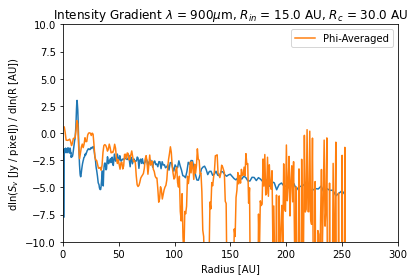

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


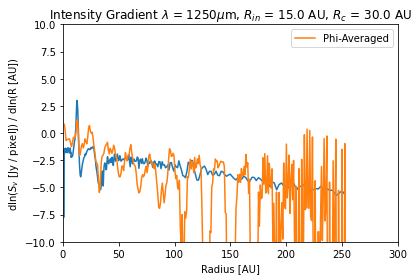

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


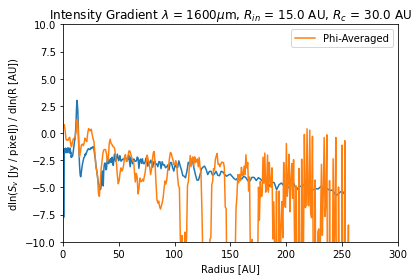

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


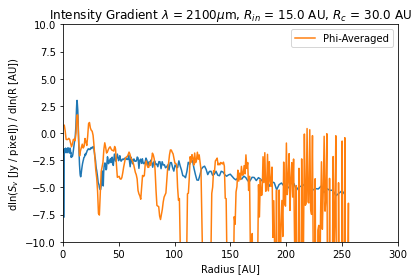

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


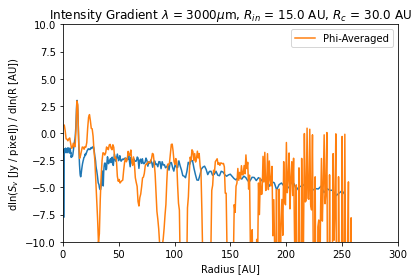

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


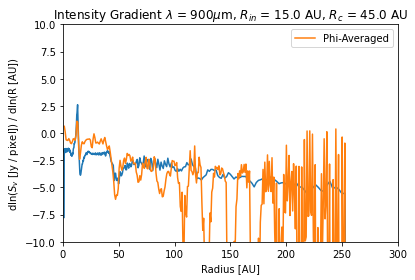

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


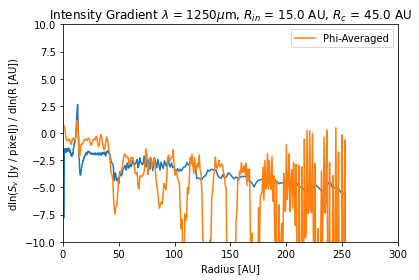

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


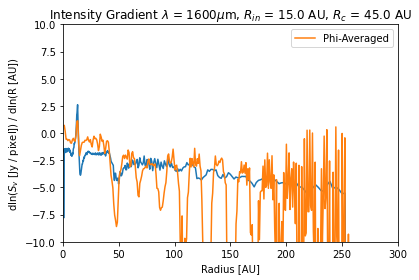

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


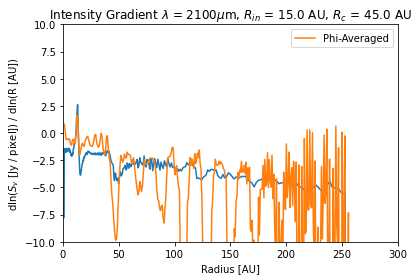

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


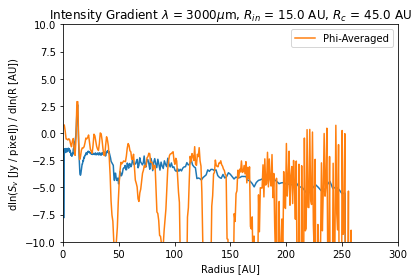

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


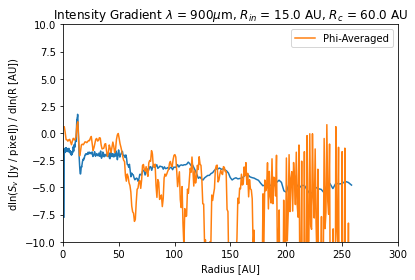

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


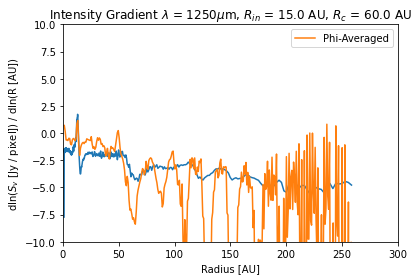

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


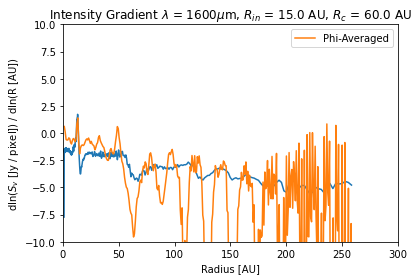

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


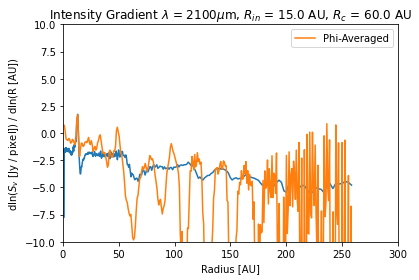

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


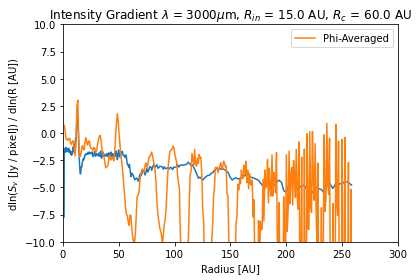

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


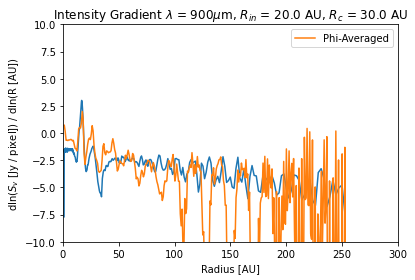

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


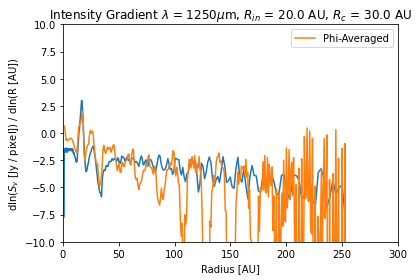

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


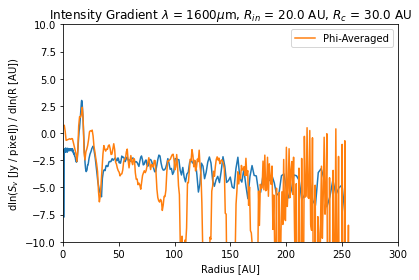

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


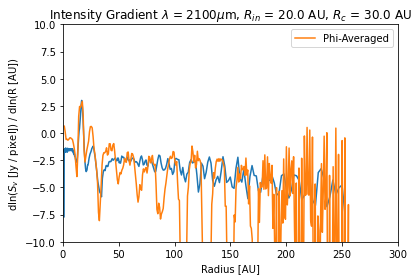

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


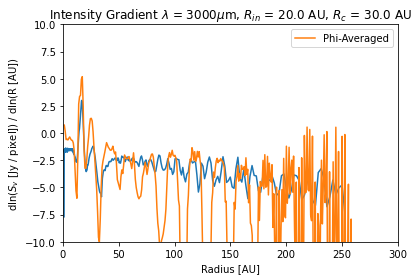

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


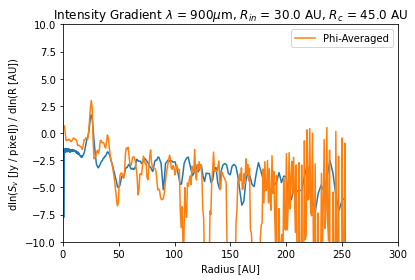

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


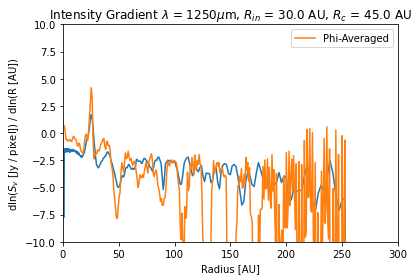

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


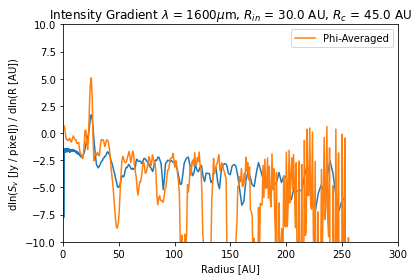

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


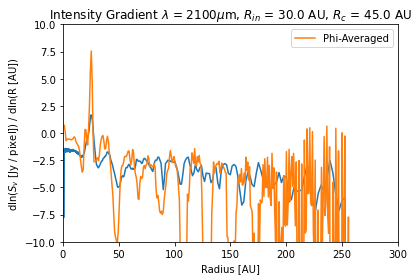

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


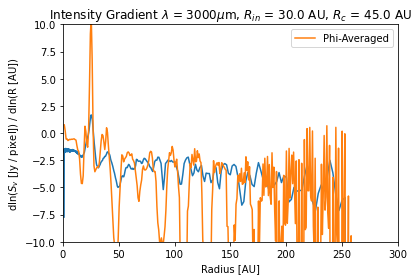

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


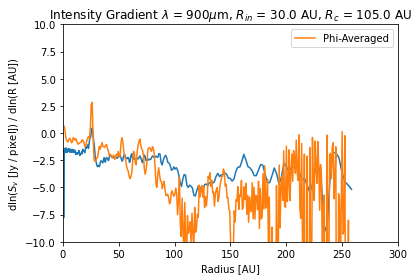

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


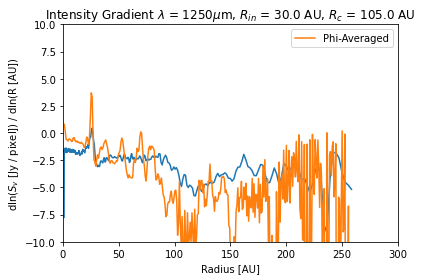

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


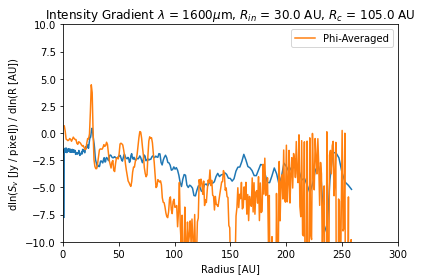

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


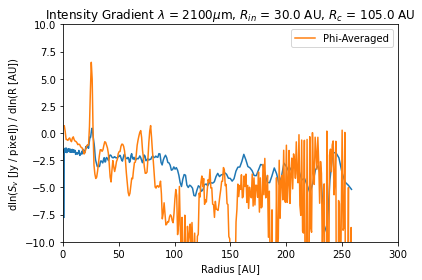

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


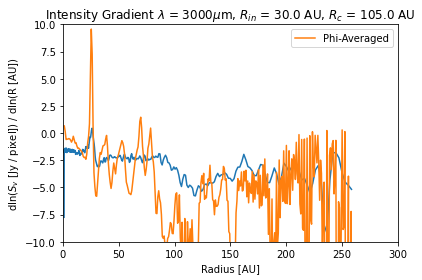

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


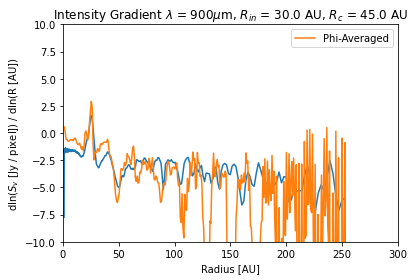

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


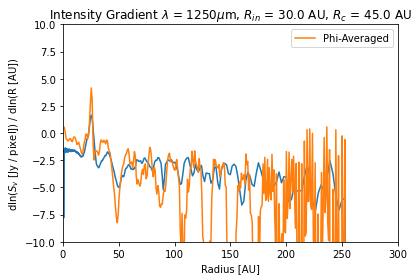

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


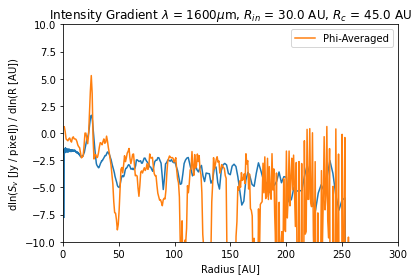

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


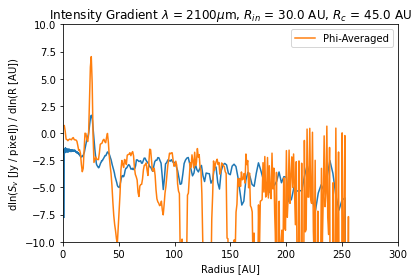

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


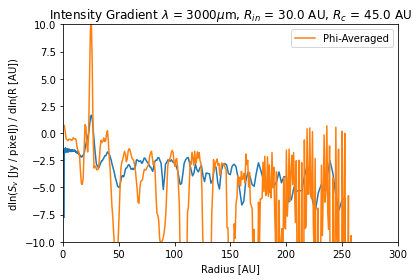

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


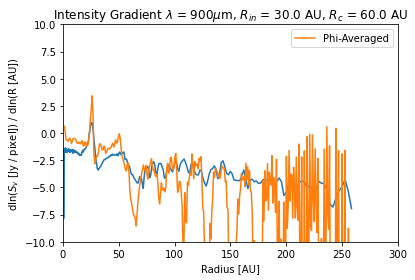

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


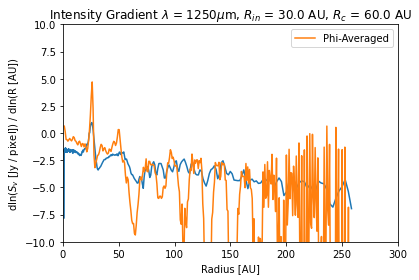

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


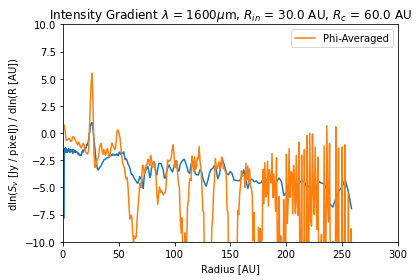

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


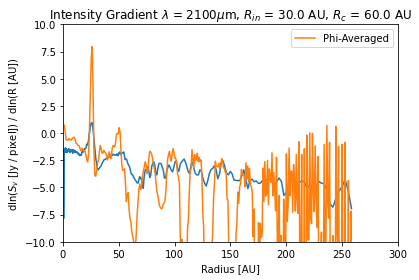

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


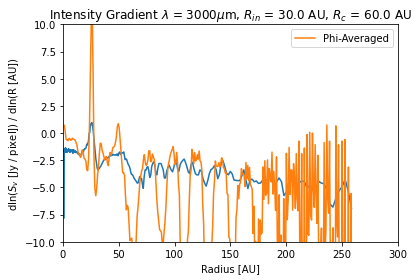

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


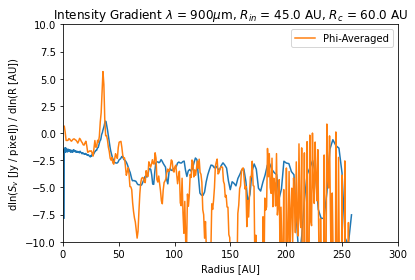

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


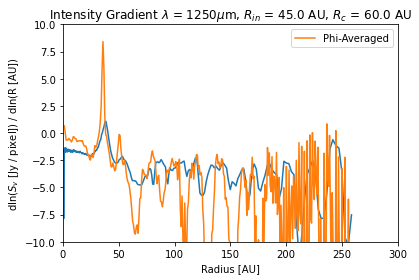

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


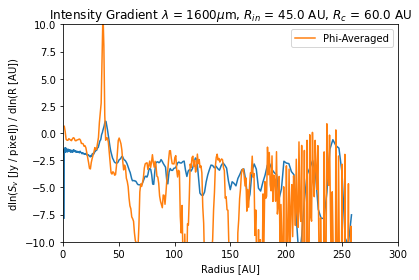

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


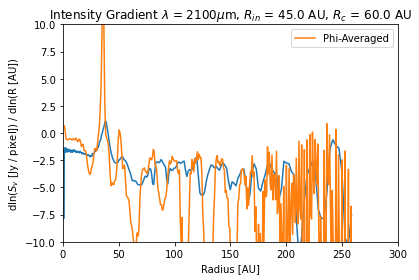

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


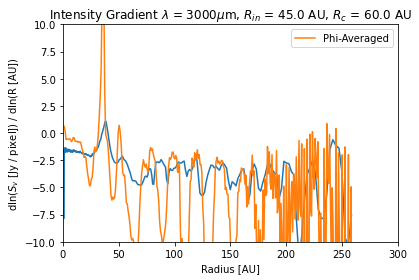

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


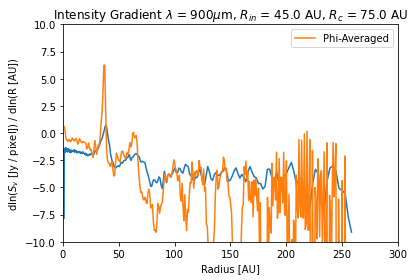

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


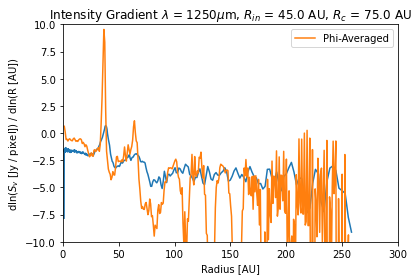

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


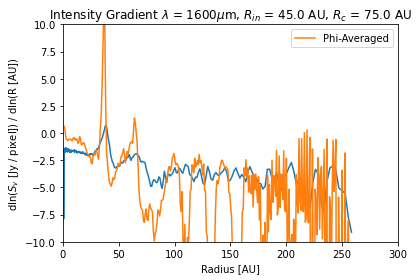

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


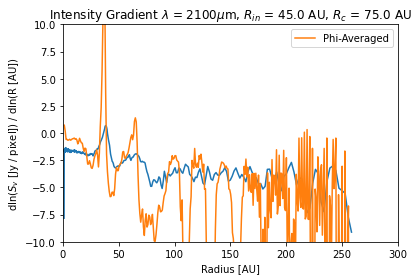

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


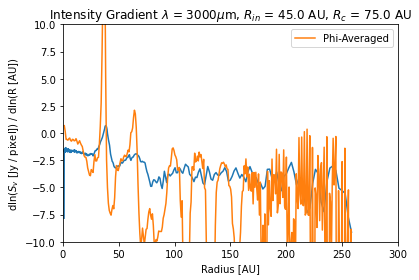

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


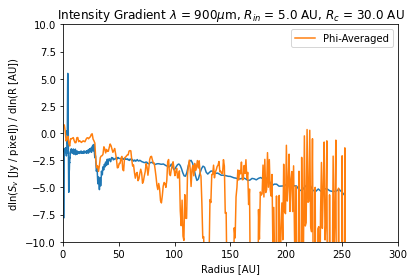

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


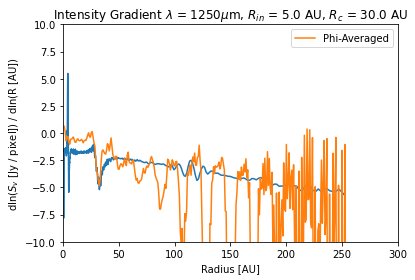

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


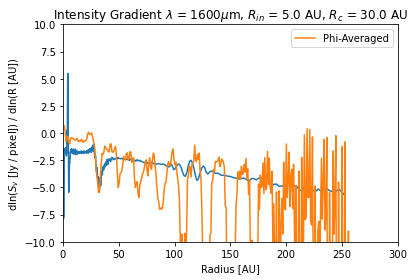

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


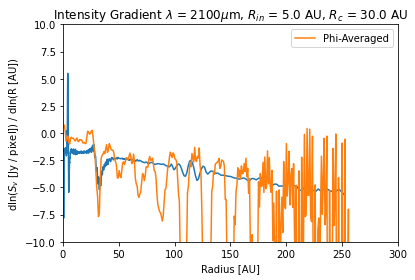

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


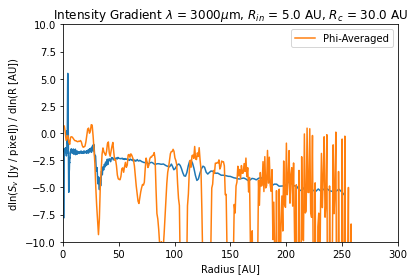

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


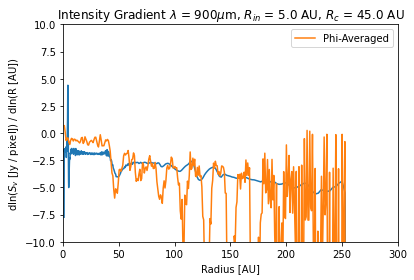

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


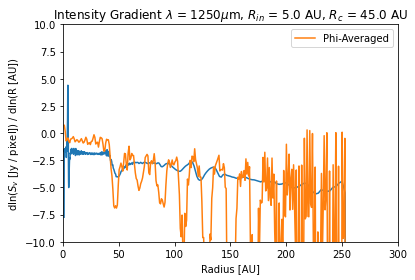

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


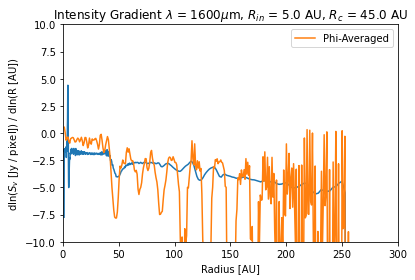

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


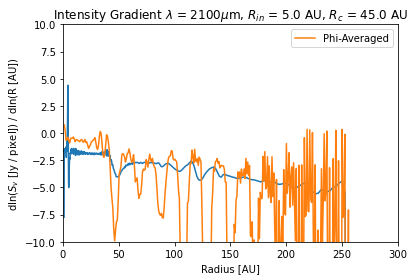

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


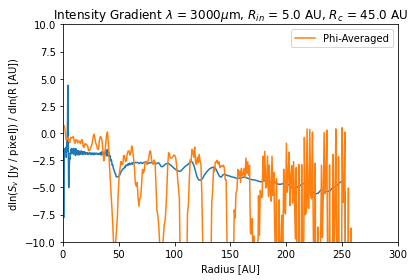

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


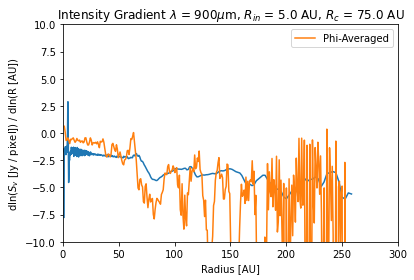

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


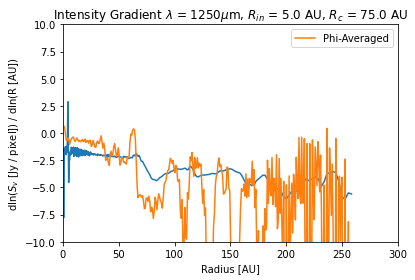

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


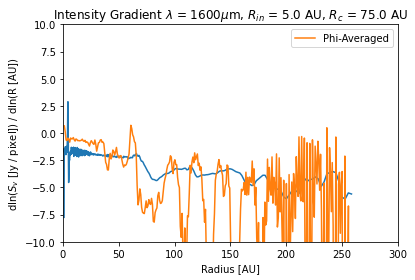

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


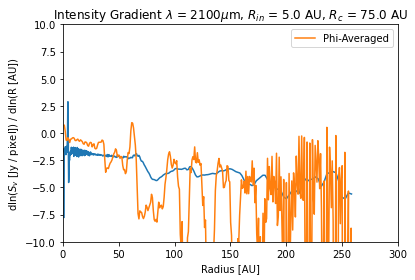

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


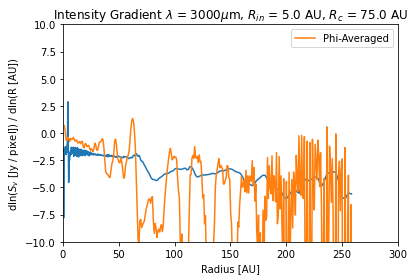

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


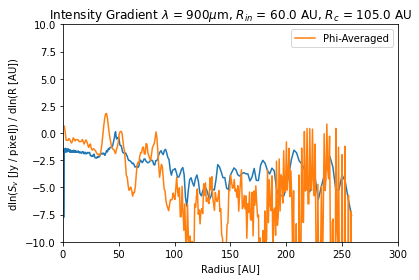

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


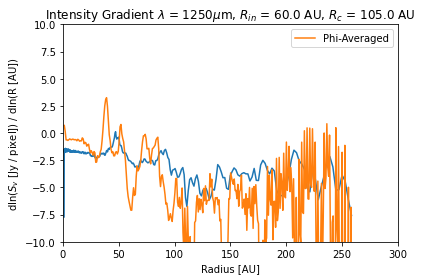

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


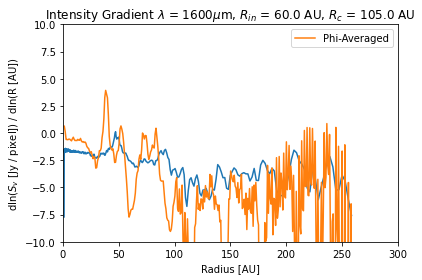

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


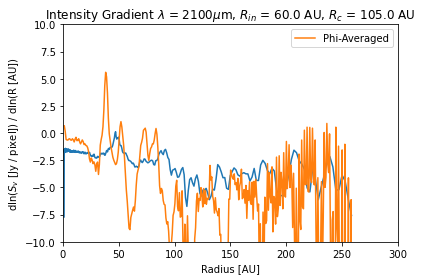

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


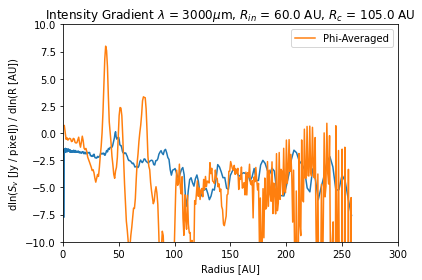

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


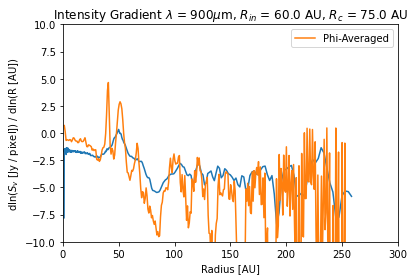

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


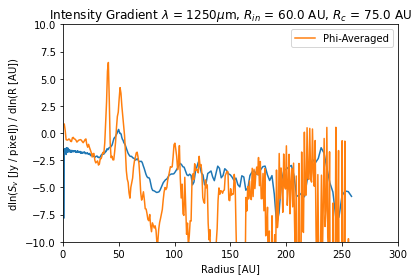

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


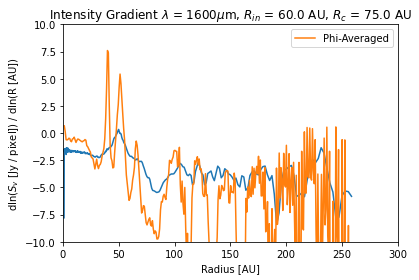

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


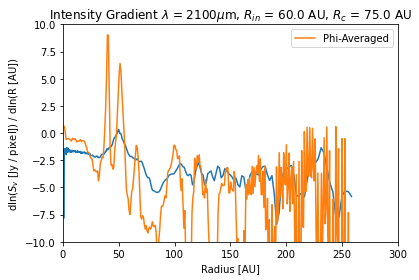

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


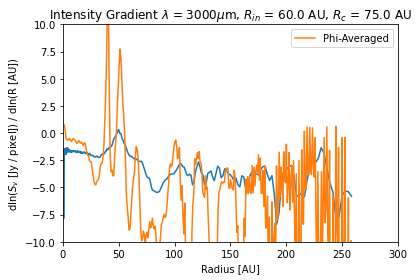

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


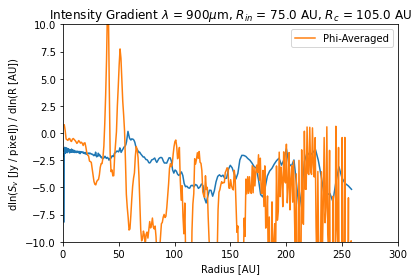

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


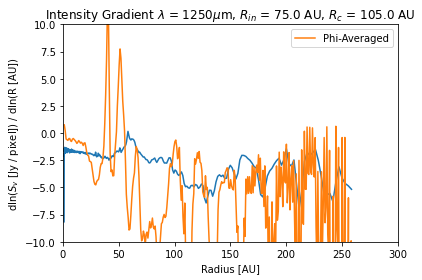

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


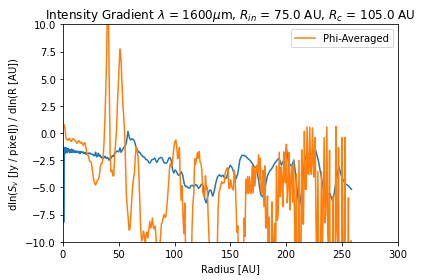

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


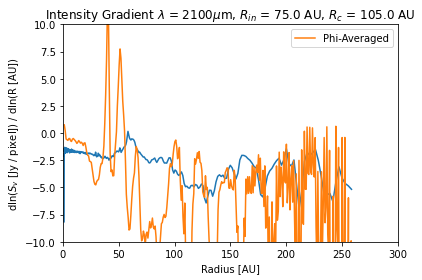

/tmp/ipykernel_175/648289500.py:60: RuntimeWarning: divide by zero encountered in log
  plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in subtract
  out[tuple(slice1)] = (f[tuple(slice4)] - f[tuple(slice2)]) / (2. * ax_dx)
/home/evan/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_n


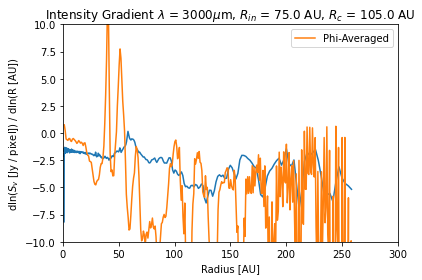

In [32]:


from scipy import stats

#Define cartesian coordinates
ConvIm = NPimage[0].imConv(dpc=260, psfType='gauss', fwhm=[.1,.1], pa=0, tdiam_prim=8.2, tdiam_sec=0.94)
radmc_gridx = ConvIm.x
radmc_gridy = ConvIm.y

#Convert cartesian values to (r, phi) values
rphi_values = np.empty((len(radmc_gridx)*len(radmc_gridy), 2))
for i in range(0, len(radmc_gridx)):
    for j in range(0, len(radmc_gridy)):
        rphi_values[i*len(radmc_gridx) + j][0] = float(np.sqrt(radmc_gridx[i]**2 + radmc_gridy[j]**2) / au)
        rphi_values[i*len(radmc_gridx) + j][1] = float(np.arctan(radmc_gridy[j] / radmc_gridx[i]))

bin_center_list = [[[] for j in range(0, len(wavelengths))] for i in range(0, len(SD_Pert))]
jyppix_binned_list = [[[] for j in range(0, len(wavelengths))] for i in range(0, len(SD_Pert))]
for i in range(0, len(SD_Pert)):
    for j in range(0, len(wavelengths)):
        ConvIm = Image_list[i][j].imConv(dpc=260, psfType='gauss', fwhm=[.01,.01], pa=0, tdiam_prim=8.2, tdiam_sec=0.94)
        
        
        #Change the shape of the image array
        jyppix_image = np.empty(len(radmc_gridx)*len(radmc_gridy))
        for k in range(0, len(radmc_gridx)):
            for l in range(0, len(radmc_gridy)):
                jyppix_image[k*len(radmc_gridx) + l] = Image_list[i][j].image[k, l, 0]

        #Average the radiation intensity across the radial bins
        jyppix_binned = stats.binned_statistic(rphi_values[:,0], jyppix_image, statistic = 'mean', bins = 500)
        jyppix_binned_list[i][j] = jyppix_binned[0]

        #Calculate radial bin centers
        bin_centers = np.empty(len(jyppix_binned[1]) - 1)
        for k in range(0, len(jyppix_binned[1]) - 1):
            bin_centers[k] = (jyppix_binned[1][k] + jyppix_binned[1][k + 1]) / 2
            
        bin_center_list[i][j] = bin_centers
        
for i in range(0, len(SD_Pert)):
    for j in range(0, len(wavelengths)):
        
        x = data.grid.x/natconst.au
    
        #Calculate the mean temperature over the first 20 values in the angular direction
        temp = np.average(temp_list[i], axis = 0)
        temp_for_avg = [[] for k in range(0, 20)]
        for k in range(-21, -1):
            temp_for_avg[k + 20] = temp[k]

        temp_avg = np.sum(temp_for_avg, axis = 0) / len(temp_for_avg)

        H = hp / au#[(l_index - B):(l_index + F)] / au
        Sigma_gas = SD_Pert[i].Sg_p_tot_i#[(l_index - B):(l_index + F)]
        T = temp_avg#[(l_index - B):(l_index + F)]
        R = x#[(l_index - B):(l_index + F)]

        plt.plot(R, Eta(H, Sigma_gas, T, R))
             
        
        plt.plot(bin_center_list[i][j], np.gradient(np.log(jyppix_binned_list[i][j])) / np.gradient(np.log(bin_center_list[i][j])), label = 'Phi-Averaged')
        #plt.plot((ConvIm.x / au)[250:501], np.log(ConvIm.imageJyppix[250:501,250,0]), label = 'y = 0')
        plt.legend()
        plt.xlabel('Radius [AU]')
        plt.xlim(0, 300)
        plt.ylim(-10, 10)
        plt.ylabel('dln($S_{v}$ [Jy / pixel]) / dln(R [AU])')
        plt.title('Intensity Gradient $\lambda$ = '+str(wavelengths[j])+'$\mu$m, $R_{in}$ = '+str(Rin_list[i])+' AU, $R_c$ = '+str(Rc_list[i])+' AU')
        plt.show()
        
#motivation and aims
#methods
#what form the results take and what their point is
#impact statement

(500,)


In [ ]:
from scipy.optimize import curve_fit


I_max = np.empty((len(SD_Pert), len(wavelengths)))
I_min = np.empty((len(SD_Pert), len(wavelengths))) 
I_amp = np.empty((len(SD_Pert), len(wavelengths)))
I_loc = np.empty((len(SD_Pert), len(wavelengths)))
I_width = np.empty((len(SD_Pert), len(wavelengths)))
for i in range(0, len(SD_Pert)):
    for j in range(0, len(wavelengths)):
    
        x = data.grid.x/natconst.au
        l = Rin_list[i]

        #The index of x which corresponds to the value in x closest to the location of the perturbation
        l_index = np.abs(x - l).argmin()
        width = hp[l_index]

        l_index2 = np.abs(r / au - l).argmin()

        #Create a loop to find an equally spaced interval on either side of the perturbation
        for backward in range(1, l_index2): 
            if abs(x[l_index2] - x[l_index2 - backward]) <= 5*width / au: 
                pass
            else:
                B = backward
                break

        for forward in range(1, len(x) - l_index2):
            if abs(x[l_index2] - x[l_index2 + forward]) <= ((Rc_list[i] - Rin_list[i]) + 5*width / au):
                pass
            else:
                F = forward
                break

        if (l_index2 + F) > len(x):
            break
        else:
            pass

        #Find the maximum value of the data in the desired range
        max_value = 0
        index = l_index2 - B
        max_index = l_index2 - B
        for n in Image_list[i][j][0][250,:,0][(l_index2 - B):(l_index2 + F)]:
            index = index + 1
            if n > max_value:
                max_value = n
                max_index = index
            else:
                pass

        #Find the minimum value of the data in the desired range
        min_value = 0
        index = l_index2 - B
        min_index = l_index2 - B
        for n in Image_list[i][j][0][250,:,0][(l_index2 - B):(l_index2 + F)]:
            index = index + 1
            if n < min_value:
                min_value = n
                min_index = index
            else:
                pass

        #Define a function form for curve-fitting
        def fit_form(dist, a, b, c, d):
            return a*np.exp(-(dist - b)**2 / (2*c**2)) + d

        #Focus on the data in the desired range
        xdata = (r / au)[(l_index2 - B):(l_index2 + F)] 
        ydata = Image_list[i][j][0][250,:,0][(l_index2 - B):(l_index2 + F)] 
        plt.plot(xdata, ydata)
        plt.title('Radiation Intensity $R_{in}$ = '+str(Rin_list[i])+' AU, $R_c$ = '+str(Rc_list[i])+' AU, $\lambda$ = '+str(wavelengths[j])+' $\mu$m')
        plt.plot(np.gradient(np.log(ydata)) / np.gradient(np.log(xdata)))
        plt.title('Intensity Gradient $R_{in}$ = '+str(Rin_list[i])+' AU, $R_c$ = '+str(Rc_list[i])+' AU, $\lambda$ = '+str(wavelengths[j])+' $\mu$m')
        plt.show()

        p0 = [Rin_list[i], l / au, width / au, 1]
        #bounds = [[max_value - max_value / 4, l / au - 2, .5*width / au, min_value + min_value / 4, l / au, width / au, -np.inf], [max_value + max_value / 4, l / au, 4*width / au, min_value - min_value / 4, l / au + 2, 4*width / au, np.inf]]
        popt, pcov = curve_fit(fit_form, xdata, ydata, p0 = p0, maxfev = 100000)
        plt.plot(xdata, fit_form(xdata, *popt))
        plt.show()

        plt.plot(xdata, np.gradient(np.log(fit_form(xdata, *popt))) / np.gradient(np.log(xdata)))
        plt.show()

        #Define a function for shortening parameter lengths
        def round_func(num):
            return str(round(num, 2-int(np.floor(np.log10(abs(num))))))

        #Find the extrema of the fit and append to T_max
        fit_max = np.max(fit_form(xdata, *popt))
        fit_min = np.min(fit_form(xdata, *popt))
        I_max[i][j] = fit_max
        I_min[i][j] = fit_min

        a, b, c, d = popt
        I_amp[i][j] = a
        I_loc[i][j] = b
        I_width[i][j] = c                                                                                
        print('Fit Equation: '+round_func(a)+'exp(-(R - '+round_func(b)+')**2 / 2*'+round_func(c)+'**2) + '+round_func(d))
        print("Maximum Value: " +str(fit_max))
        print(max_index)
        print("Minimum Value: " +str(fit_min))
        print(min_index)

        

In [ ]:
for i in range(0, len(SD_Pert)):
    for j in range(0, len(wavelengths)):
        print('Intensity Image: R_in = '+str(Rin_list[i])+' AU, R_c = '+str(Rc_list[i])+' AU')
        plotImage(Image_list[i][j][1],au=True,log=True,maxlog=3,bunit='jy/pixel',dpc=dpc,cmap='magma')
        plt.show()

In [ ]:
#Plot maximum temperature variation percentage as a function of radius and amplitude
fig = plt.figure(figsize = (10,10))
ax = plt.axes(projection='3d') 
ax.set_title('Parameter Search Plot')
ax.set_xlabel('Perturbation Amplitude [% increase]')
ax.set_ylabel('Perturbation Location [AU]')
ax.set_zlabel('Maximum of Mean Percent Temperature Variation [%]')

X, Y = np.meshgrid(SD_amp, SD_loc)
Z = T_max
#Find a way to generalize the end bound of the plots before unphysical data due to boundary effects can ruin them.

ax.plot_surface(100*X[0:-4], Y[0:-4], Z[0:-4], rcount = 100, ccount = 100, edgecolor = 'none', cmap = cm.coolwarm)
plt.show()

fig = plt.figure(figsize = (10,10))
ax = plt.axes(projection='3d')
ax.set_title('Parameter Search Plot')
ax.set_xlabel('Perturbation Amplitude [% increase]')
ax.set_ylabel('Perturbation Location [AU]')
ax.set_zlabel('Maximum of Mean Percent Temperature Variation [%]')

X, Y = np.meshgrid(SD_amp, SD_loc)
Z = T_max
ax.plot_surface(100*X[0:-4], Y[0:-4], Z[0:-4], rcount = 100, ccount = 100, edgecolor = 'none', cmap = cm.coolwarm)
ax.view_init(20,180)
plt.show()

fig = plt.figure(figsize = (10,10))
ax = plt.axes(projection='3d')
ax.set_title('Parameter Search Plot')
ax.set_xlabel('Perturbation Amplitude [% increase]')
ax.set_ylabel('Perturbation Location [AU]')
ax.set_zlabel('Maximum of Mean Percent Temperature Variation [%]')
ax.plot_surface(100*X[0:-4], Y[0:-4], Z[0:-4], rcount = 100, ccount = 100, edgecolor = 'none', cmap = cm.coolwarm)
ax.view_init(20,90)
plt.show()


In [ ]:
Z = T_max

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Ampltiude [% increase]')
plt.ylabel('Maximum of Mean Percent Temperature Variation [%]')
plt.title('Temperature Variation vs. Perturbation Amplitude')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']
for i in range(0, len(Z) - 4):
    plt.plot(100*SD_amp, Z[i], label = str(SD_loc[i]), marker = markers[i % 7], markersize = 8)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

MeanMaxT = np.array([])
for i in range(0, len(np.transpose(Z)) - 1):
    MeanMaxT = np.append(MeanMaxT, sum(np.transpose(Z)[i]) / len(np.transpose(Z)[i])) 

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Ampltude [%]')
plt.ylabel('Average Across Locations [%]')
plt.title('Mean Temperature Variation vs. Perturbation Ampltiude')
plt.plot(SD_loc, MeanMaxT)
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Maximum of Mean Percent Temperature Variation [%]')
plt.title('Temperature Variation vs. Perturbation Location')
for i in range(0, len(Z)):
    plt.plot(np.transpose(SD_loc[0:-4]), np.transpose(Z[0:-4])[i], label = str(100*SD_amp[i])+'%', marker = markers[i % 7], markersize = 8)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
plt.show()

MeanMaxT = np.array([])
for i in range(0, len(Z) - 4):
    MeanMaxT = np.append(MeanMaxT, sum(Z[i]) / len(Z[i])) 
    
plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Average Across Amplitudes [%]')
plt.title('Mean Temperature Variation vs. Perturbation Location')
plt.plot(SD_loc[0:-4], MeanMaxT)
plt.show()



In [ ]:
#Surface Density Perturbation Gaussian Paramaters to Temperature Variation Gaussian Parameters

def SD_to_T(SD_amplitude, SD_location):
    T_gauss_param = [[[] for j in range(0, len(SD_amplitude))] for i in range(0, len(SD_location))]
    Param_map = [[[] for j in range(0, len(SD_amplitude))] for i in range(0, len(SD_location))]
    #Update the variables
    for i in range(0, len(SD_location)):
        for j in range(0, len(SD_amplitude)):
            T_gauss_param[i][j] = np.array([T_amp1[i][j], T_loc1[i][j], T_width1[i][j], T_amp2[i][j], T_loc2[i][j], T_width2[i][j]])
            Param_map[i][j] = [np.array([SD_location[i], SD_amplitude[j]]), T_gauss_param[i][j]]
    return Param_map

Param_map = SD_to_T(SD_amp, SD_loc)

In [ ]:
fig = plt.figure(figsize = (10,10))
ax = plt.axes(projection='3d')
ax.set_title('Parameter Search Plot')
ax.set_xlabel('Perturbation Amplitude [% increase]')
ax.set_ylabel('Perturbation Location [AU]')
ax.set_zlabel('Gaussian Amplitude Parameter for Temperature Variation Maximum')

X, Y = np.meshgrid(SD_amp, SD_loc)
Z = T_amp1
ax.plot_surface(100*X[0:-4], Y[0:-4], Z[0:-4], rcount = 100, ccount = 100, edgecolor = 'none', cmap = cm.coolwarm)
plt.show()


fig = plt.figure(figsize = (10,10))
ax = plt.axes(projection='3d')
ax.set_title('Parameter Search Plot')
ax.set_xlabel('Perturbation Amplitude [% increase]')
ax.set_ylabel('Perturbation Location [AU]')
ax.set_zlabel('Gaussian Amplitude Parameter for Temperature Variation Maximum')

X, Y = np.meshgrid(SD_amp, SD_loc)
Z = T_amp1
ax.plot_surface(100*X[0:-4], Y[0:-4], Z[0:-4], rcount = 100, ccount = 100, edgecolor = 'none', cmap = cm.coolwarm)
ax.view_init(20,180)
plt.show()

fig = plt.figure(figsize = (10,10))
ax = plt.axes(projection='3d')
ax.set_title('Parameter Search Plot')
ax.set_xlabel('Perturbation Amplitude [% increase]')
ax.set_ylabel('Perturbation Location [AU]')
ax.set_zlabel('Gaussian Amplitude Parameter for Temperature Variation Maximum')
ax.plot_surface(100*X[0:-4], Y[0:-4], Z[0:-4], rcount = 100, ccount = 100, edgecolor = 'none', cmap = cm.coolwarm)
ax.view_init(20,90)
plt.show()

In [ ]:
#Correspondance Between Surface Density Perturbation Amplitude and Temperature Variation Maximum Amplitude

#Inferences from Plots:

#Plots 1 and 2: The magnitude of the temperature variation maximum increases as the surface density perturbation
#amplitude increases. In the outer disk, the temperature variation maximum is less sensitive to surface density 
#perturbation, meaning a larger perturbation is needed to achieve the same value of temperature variation at an 
#inner radius.

#Plots 3 and 4:
#The magnitude of the temperature variation maximum spikes as the surface density perturbation location moves
#from the inner disk to the middle disk. It then tapers off as the perturbation location moves from the middle 
#disk to the outer disk. 

Z = T_amp1

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Ampltiude [%]')
plt.ylabel('Gaussian Amplitude Parameter for Temperature Variation Maximum [%]')
plt.title('Temperature Amplitude Max vs. Perturbation Amplitude')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']
for i in range(0, len(Z) - 4):
    plt.plot(100*SD_amp, Z[i], label = str(SD_loc[i]), marker = markers[i % 7], markersize = 8)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Ampltiude [%]')
plt.ylabel('Gaussian Amplitude Parameter for Temperature Variation Maximum [%]')
plt.title('Temperature Amplitude Max vs. Perturbation Amplitude')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']

#find the index that corresponds to the first value over 100AU
Inner_Cutoff = 0
for i in SD_loc:
    if i < 75:
        Inner_Cutoff += 1
    else:
        break
        
Mid_Cutoff = 0
for i in SD_loc:
    if i < 125:
        Mid_Cutoff += 1
    else:
        break
        
plt.plot(100*SD_amp, sum(Z[0:Inner_Cutoff]) / len(Z[0:Inner_Cutoff]), label = 'Inner Disk (25 AU, 75 AU)', marker = markers[1])
plt.plot(100*SD_amp, sum(Z[Inner_Cutoff:Mid_Cutoff]) / len(Z[Inner_Cutoff:Mid_Cutoff]), label = 'Middle Disk [75 AU, 125 AU)', marker = markers[4])
plt.plot(100*SD_amp, sum(Z[Mid_Cutoff:-4]) / len(Z[Mid_Cutoff:-4]), label = 'Outer Disk >125 AU', marker = markers[0])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Gaussian Amplitude Parameter for Temperature Variation Maximum [%]')
plt.title('Temperature Amplitude Max vs. Perturbation Location')
for i in range(0, len(Z)):
    plt.plot(SD_loc[0:-4], np.transpose(Z[0:-4])[i], label = str(100*SD_amp[i])+'%', marker = markers[i % 7], markersize = 8)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Gaussian Amplitude Parameter for Temperature Variation Maximum [%]')
plt.title('Temperature Amplitude Max vs. Perturbation Location')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']
        
#Create amplitude categories
Low_Cutoff = 0
for i in SD_amp:
    if i < 5:
        Low_Cutoff += 1
    else:
        break

Mid_Cutoff = 0
for i in SD_amp:
    if i < 8:
        Mid_Cutoff += 1
    else:
        break

plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[0:Low_Cutoff]) / len(np.transpose(Z[0:-4])[0:Low_Cutoff]), label = 'Low Perturbation (0%, 500%)', marker = markers[1])
plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[Low_Cutoff:Mid_Cutoff]) / len(np.transpose(Z[0:-4])[Low_Cutoff:Mid_Cutoff]), label = 'Medium Perturbation [500%, 800%)', marker = markers[4])
plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[Mid_Cutoff:]) / len(np.transpose(Z[0:-4])[Mid_Cutoff:]), label = 'Strong Perturbation [800%, +inf)', marker = markers[0])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


In [ ]:
#Correspondance Between Surface Density Perturbation Amplitude and Temperature Variation Minimum Amplitude

#Inferences from Plots:

#Plots 1 and 2: The magnitude of the temperature variation minimum increases as the surface density perturbation
#amplitude increases. In the outer disk, the temperature variation minimum is less sensitive to surface density 
#perturbation, meaning a larger perturbation is needed to achieve the same value of temperature variation at an 
#inner radius.

#Plots 3 and 4:
#The magnitude of the temperature variation minimum spikes as the surface density perturbation location moves
#from the inner disk to the middle disk. It then tapers off as the perturbation location moves from the middle 
#disk to the outer disk. 

Z = T_amp2

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Ampltiude [%]')
plt.ylabel('Gaussian Amplitude Parameter for Temperature Variation Minimum')
plt.title('Temperature Amplitude Min vs. Perturbation Amplitude')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']
for i in range(0, len(Z) - 4):
    plt.plot(100*SD_amp, Z[i], label = str(Y[i][0]), marker = markers[i % 7], markersize = 8)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Ampltiude [%]')
plt.ylabel('Gaussian Amplitude Parameter for Temperature Variation Minimum')
plt.title('Temperature Amplitude Min vs. Perturbation Amplitude')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']
#find the index that corresponds to the first value over 100AU
Inner_Cutoff = 0
for i in SD_loc:
    if i < 75:
        Inner_Cutoff += 1
    else:
        break
        
Mid_Cutoff = 0
for i in SD_loc:
    if i < 125:
        Mid_Cutoff += 1
    else:
        break
        
plt.plot(100*SD_amp, sum(Z[0:Inner_Cutoff]) / len(Z[0:Inner_Cutoff]), label = 'Inner Disk (25 AU, 75 AU)', marker = markers[1])
plt.plot(100*SD_amp, sum(Z[Inner_Cutoff:Mid_Cutoff]) / len(Z[Inner_Cutoff:Mid_Cutoff]), label = 'Middle Disk [75 AU, 125 AU)', marker = markers[4])
plt.plot(100*SD_amp, sum(Z[Mid_Cutoff:-4]) / len(Z[Mid_Cutoff:-4]), label = 'Outer Disk >125 AU', marker = markers[0])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Gaussian Amplitude Parameter for Temperature Variation Min')
plt.title('Temperature Amplitude Min vs. Perturbation Location')
for i in range(0, len(Z)):
    plt.plot(SD_loc[0:-4], np.transpose(Z[0:-4])[i], label = str(100*X[0][i])+'%', marker = markers[i % 7], markersize = 8)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Gaussian Amplitude Parameter for Temperature Variation Minimum')
plt.title('Temperature Amplitude Min vs. Perturbation Location')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']

#Create amplitude categories
Low_Cutoff = 0
for i in SD_amp:
    if i < 5:
        Low_Cutoff += 1
    else:
        break

Mid_Cutoff = 0
for i in SD_amp:
    if i < 8:
        Mid_Cutoff += 1
    else:
        break

plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[0:Low_Cutoff]) / len(np.transpose(Z[0:-4])[0:Low_Cutoff]), label = 'Low Perturbation (0%, 500%)', marker = markers[1])
plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[Low_Cutoff:Mid_Cutoff]) / len(np.transpose(Z[0:-4])[Low_Cutoff:Mid_Cutoff]), label = 'Medium Perturbation [500%, 800%)', marker = markers[4])
plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[Mid_Cutoff:]) / len(np.transpose(Z[0:-4])[Mid_Cutoff:]), label = 'Strong Perturbation [800%, +inf)', marker = markers[0])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


In [ ]:
#Correspondance Between Surface Density Perturbation Location and Temperature Variation Maximum Location

#Inferences from Plots:

#Plot 1: For a given surface density perturbation location, changing the amplitude has little to no effect on the 
#location of the temperature variation maximum.

#Plots 2 - 4: For all surface density perturbation amplitudes, there is a positive linear relationship between 
#the surface density perturbation location and the location of the temperature variation maximum.

Z = T_loc1

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Ampltiude [%]')
plt.ylabel('Gaussian Location Parameter for Temperature Variation Maximum')
plt.title('Temperature Max Location vs. Perturbation Amplitude')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']
for i in range(0, len(Z) - 4):
    plt.plot(100*SD_amp, Z[i], label = str(Y[i][0]), marker = markers[i % 7], markersize = 8)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Gaussian Location Parameter for Temperature Variation Maximum')
plt.title('Temperature Max Location vs. Perturbation Location')
for i in range(0, len(Z)):
    plt.plot(SD_loc[0:-4], np.transpose(Z[0:-4])[i], label = str(100*X[0][i])+'%', marker = markers[i % 7], markersize = 8)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Gaussian Location Parameter for Temperature Variation Maximum')
plt.title('Temperature Max Location vs. Perturbation Location')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']

#Create amplitude categories
Low_Cutoff = 0
for i in SD_amp:
    if i < 5:
        Low_Cutoff += 1
    else:
        break

Mid_Cutoff = 0
for i in SD_amp:
    if i < 8:
        Mid_Cutoff += 1
    else:
        break

plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[0:Low_Cutoff]) / len(np.transpose(Z[0:-4])[0:Low_Cutoff]), label = 'Low Perturbation (0%, 500%)', marker = markers[1])
plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[Low_Cutoff:Mid_Cutoff]) / len(np.transpose(Z[0:-4])[Low_Cutoff:Mid_Cutoff]), label = 'Medium Perturbation [500%, 800%)', marker = markers[4])
plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[Mid_Cutoff:]) / len(np.transpose(Z[0:-4])[Mid_Cutoff:]), label = 'Strong Perturbation [800%, +inf)', marker = markers[0])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

MeanMaxLoc = np.array([])
for i in range(0, len(Z) - 4):
    MeanMaxLoc = np.append(MeanMaxLoc, sum(Z[i]) / len(Z[i])) 
    
plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Average Across Amplitudes [%]')
plt.title('Mean Temperature Max Location vs. Perturbation Location')
plt.plot(SD_loc[0:-4], MeanMaxLoc)
plt.show()

In [ ]:
#Correspondance Between Surface Density Perturbation Location and Temperature Variation Minimum Location

#Inferences from Plots:

#Plot 1: For a given surface density perturbation location, changing the amplitude has little to no effect on the 
#location of the temperature variation minimum.

#Plots 2 - 4: For all surface density perturbation amplitudes, there is a positive linear relationship between 
#the surface density perturbation location and the location of the temperature variation minimum.


Z = T_loc2

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Ampltiude [%]')
plt.ylabel('Gaussian Location Parameter for Temperature Variation Minimum')
plt.title('Temperature Min Location vs. Perturbation Amplitude')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']
for i in range(0, len(Z) - 4):
    plt.plot(100*SD_amp, Z[i], label = str(Y[i][0]), marker = markers[i % 7], markersize = 8)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Gaussian Location Parameter for Temperature Variation Minimum')
plt.title('Temperature Min Location vs. Perturbation Location')
for i in range(0, len(Z)):
    plt.plot(SD_loc[0:-4], np.transpose(Z[0:-4])[i], label = str(100*X[0][i])+'%', marker = markers[i % 7], markersize = 8)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Gaussian Location Parameter for Temperature Variation Min')
plt.title('Temperature Min Location vs. Perturbation Location')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']

#Create amplitude categories
Low_Cutoff = 0
for i in SD_amp:
    if i < 5:
        Low_Cutoff += 1
    else:
        break

Mid_Cutoff = 0
for i in SD_amp:
    if i < 8:
        Mid_Cutoff += 1
    else:
        break

plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[0:Low_Cutoff]) / len(np.transpose(Z[0:-4])[0:Low_Cutoff]), label = 'Low Perturbation (0%, 500%)', marker = markers[1])
plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[Low_Cutoff:Mid_Cutoff]) / len(np.transpose(Z[0:-4])[Low_Cutoff:Mid_Cutoff]), label = 'Medium Perturbation [500%, 800%)', marker = markers[4])
plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[Mid_Cutoff:]) / len(np.transpose(Z[0:-4])[Mid_Cutoff:]), label = 'Strong Perturbation [800%, +inf)', marker = markers[0])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


MeanMinLoc = np.array([])
for i in range(0, len(Z) - 4):
    MeanMinLoc = np.append(MeanMinLoc, sum(Z[i]) / len(Z[i])) 
    
plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Average Across Amplitudes [%]')
plt.title('Mean Temperature Min Location vs. Perturbation Location')
plt.plot(SD_loc[0:-4], MeanMinLoc)
plt.show()

In [ ]:
#Correspondance Between Surface Density Perturbation Width and Temperature Variation Maximum Width

#Plot Inferences:

#1. For all perturbation strengths, as the surface density perturbation width increases, the width of the gaussian 
#that primarily models the temperature variation maximum increases at about the same rate, which approximately 
#results in a positive linear relationship.

Z = T_width1

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Ampltiude [%]')
plt.ylabel('Gaussian Width Parameter for Temperature Variation Maximum')
plt.title('Temperature Max Width vs. Perturbation Amplitude')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']
for i in range(0, len(Z) - 4):
    plt.plot(100*SD_amp, Z[i], label = str(Y[i][0]), marker = markers[i % 7], markersize = 8)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Gaussian Width Parameter for Temperature Variation Maximum')
plt.title('Temperature Max Width vs. Perturbation Location')
for i in range(0, len(Z)):
    plt.plot(SD_loc[0:-4], np.transpose(Z[0:-4])[i], label = str(100*X[0][i])+'%', marker = markers[i % 7], markersize = 8)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Width [AU]')
plt.ylabel('Gaussian Width Parameter for Temperature Variation Maximum')
plt.title('Temperature Max Width vs. Perturbation Width')
for i in range(0, len(Z)):
    plt.plot(SD_width[0:-4], np.transpose(Z[0:-4])[i], label = str(100*X[0][i])+'%', marker = markers[i % 7], markersize = 8)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Width [AU]')
plt.ylabel('Gaussian Width Parameter for Temperature Variation Max')
plt.title('Temperature Max Width vs. Perturbation Width')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']

#Create amplitude categories
Low_Cutoff = 0
for i in SD_amp:
    if i < 5:
        Low_Cutoff += 1
    else:
        break

Mid_Cutoff = 0
for i in SD_amp:
    if i < 8:
        Mid_Cutoff += 1
    else:
        break

plt.plot(SD_width[0:-4], sum(np.transpose(Z[0:-4])[0:Low_Cutoff]) / len(np.transpose(Z[0:-4])[0:Low_Cutoff]), label = 'Low Perturbation (0%, 500%)', marker = markers[1])
plt.plot(SD_width[0:-4], sum(np.transpose(Z[0:-4])[Low_Cutoff:Mid_Cutoff]) / len(np.transpose(Z[0:-4])[Low_Cutoff:Mid_Cutoff]), label = 'Medium Perturbation [500%, 800%)', marker = markers[4])
plt.plot(SD_width[0:-4], sum(np.transpose(Z[0:-4])[Mid_Cutoff:]) / len(np.transpose(Z[0:-4])[Mid_Cutoff:]), label = 'Strong Perturbation [800%, +inf)', marker = markers[0])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


MeanMaxWidth = np.array([])
for i in range(0, len(Z) - 4):
    MeanMaxWidth = np.append(MeanMaxWidth, sum(Z[i]) / len(Z[i])) 
    
plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Width [AU]')
plt.ylabel('Average Across Amplitudes [%]')
plt.title('Mean Temperature Max Width vs. Perturbation Width')
plt.plot(SD_width[0:-4], MeanMaxWidth)
plt.show()

In [ ]:
#Correspondance Between Surface Density Perturbation Width and Temperature Variation Minimum Width
#Plot Inferences:

#1. For all perturbation strengths, as the surface density perturbation width increases, the width of the gaussian 
#that primarily models the temperature variation maximum increases at about the same rate, which approximately 
#results in a positive linear relationship.

Z = T_width2

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Ampltiude [%]')
plt.ylabel('Gaussian Width Parameter for Temperature Variation Minimum')
plt.title('Temperature Min Width vs. Perturbation Amplitude')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']
for i in range(0, len(Z) - 4):
    plt.plot(100*SD_amp, Z[i], label = str(Y[i][0]), marker = markers[i % 7], markersize = 8)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Gaussian Width Parameter for Temperature Variation Minimum')
plt.title('Temperature Min Width vs. Perturbation Location')
for i in range(0, len(Z)):
    plt.plot(SD_loc[0:-4], np.transpose(Z[0:-4])[i], label = str(100*X[0][i])+'%', marker = markers[i % 7], markersize = 8)
    # except:
    #     plt.plot(np.transpose(Y[0:-1])[i], np.transpose(Z[0:-1])[i], label = str(100*X[0][i])+'%', marker = i + 2, markersize = 10)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Gaussian Width Parameter for Temperature Variation Min')
plt.title('Temperature Min Width vs. Perturbation Location')
markers = ['*', 'o', 'v', '1', 's', 'X', 'd']

#Create amplitude categories
Low_Cutoff = 0
for i in SD_amp:
    if i < 5:
        Low_Cutoff += 1
    else:
        break

Mid_Cutoff = 0
for i in SD_amp:
    if i < 8:
        Mid_Cutoff += 1
    else:
        break

plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[0:Low_Cutoff]) / len(np.transpose(Z[0:-4])[0:Low_Cutoff]), label = 'Low Perturbation (0%, 500%)', marker = markers[1])
plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[Low_Cutoff:Mid_Cutoff]) / len(np.transpose(Z[0:-4])[Low_Cutoff:Mid_Cutoff]), label = 'Medium Perturbation [500%, 800%)', marker = markers[4])
plt.plot(SD_loc[0:-4], sum(np.transpose(Z[0:-4])[Mid_Cutoff:-1]) / len(np.transpose(Z[0:-4])[Mid_Cutoff:-1]), label = 'Strong Perturbation [800%, +inf)', marker = markers[0])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

MeanMinWidth = np.array([])
for i in range(0, len(Z) - 4):
    MeanMinWidth = np.append(MeanMinWidth, sum(Z[i]) / len(Z[i])) 
    
plt.figure(figsize = (8,8))
plt.xlabel('Perturbation Location [AU]')
plt.ylabel('Average Across Amplitudes [%]')
plt.title('Mean Temperature Min Width vs. Perturbation Location')
plt.plot(SD_loc[0:-4], MeanMinWidth)
plt.show()

In [ ]:
from radmc3dPy import image
#
# Make sure to have done the following beforhand:
#
#  First compile RADMC-3D
#  Then run:
#   python problem_setup.py
#   radmc3d mctherm
#

dpc = 260.     # Distance in parsec (for conversion to Jy/pixel in 1.3 mm map)

#
# Make and plot image of full disk at 1.3 mm: thermal dust emission
#
image.makeImage(npix=200,incl=60.,phi=30.,wav=1250,sizeau=200)   # This calls radmc3d 
im_mmPrePert1 = image.readImage()
plt.figure()
image.plotImage(im_mmPrePert1,au=True,log=True,maxlog=3,bunit='jy/pixel',dpc=dpc,cmap='magma')
plt.show()

    
#
# Make and plot image of full disk at 1 microns: scattered light
#
# makeImage(npix=200,incl=60.,phi=30.,wav=10,sizeau=200)   # This calls radmc3d 
# im_1PrePert2 = readImage()
# plt.figure()
# plotImage(im_1PrePert2,au=True,log=True,vmax=-10,vmin=-15,bunit='inu',cmap='hot')
# plt.show()

In [ ]:
p.run(['radmc3d', 'image', 'circ', 'lambda', '1250', 'setthreads', '8'])
im = image.readcircimage()
plt.loglog(im.rc / au,im.image[:,0,0,0])
plt.xlabel('r [AU]')
plt.ylabel(r'$I_\nu [erg\, cm^{-2}\, s^{-1}\, Hz^{-1}\, ster^{-1}]$')

In [ ]:
p.run(['radmc3d', 'image', 'circ', 'lambda', '1250', 'setthreads', '8'])
im = image.readcircimage()
I_for_avg = np.zeros((len(im.image[:,0,0,0])))
for i in range(-20, -1):
    I_for_avg += im.image[:, i, 0, 0]
    
I_avg = I_for_avg / 19



plt.loglog(im.rc / au, I_avg)
plt.xlabel('r [AU]')
plt.ylabel(r'$I_\nu [erg\, cm^{-2}\, s^{-1}\, Hz^{-1}\, ster^{-1}]$')
